# MICROnet Training - Comprehensive Model Comparison

This notebook trains 16 different microstructure prediction models using U-Net architecture with skip connections:

## CNN-LSTM Models (8 models):
### MSE Loss:
1. seq=2, MSE loss
2. seq=3, MSE loss
3. seq=4, MSE loss

### Combined Loss (seq=3):
4. T_solidus=1560, T_liquidus=1620, weights=70/30
5. T_solidus=1530, T_liquidus=1650, weights=70/30
6. T_solidus=1500, T_liquidus=1680, weights=70/30
7. T_solidus=1560, T_liquidus=1620, weights=50/50
8. T_solidus=1560, T_liquidus=1620, weights=30/70

## PredRNN Models (8 models):
### MSE Loss:
9. seq=2, MSE loss
10. seq=3, MSE loss
11. seq=4, MSE loss

### Combined Loss (seq=2):
12. T_solidus=1560, T_liquidus=1620, weights=70/30
13. T_solidus=1530, T_liquidus=1650, weights=70/30
14. T_solidus=1500, T_liquidus=1680, weights=70/30
15. T_solidus=1560, T_liquidus=1620, weights=50/50
16. T_solidus=1560, T_liquidus=1620, weights=30/70

All models use U-Net architecture with skip connections for improved gradient flow and feature reuse.

In [1]:
# Add project root to Python path so we can import lasernet
import sys
from pathlib import Path

project_root = Path.cwd().parent
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))
    print(f"Added {project_root} to Python path")

Added /Users/bn/dtu/LASERNet to Python path


In [2]:
import os

from pathlib import Path
import json
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from IPython.display import display, Image

from lasernet.micronet.train.trainer import (
    get_device,
    train_microstructure,
    load_model_and_predict,
    load_model_and_predict_cascaded,
    save_prediction_visualization,
    save_solidification_mask_visualization,
    save_cascaded_prediction_visualization,
)
from lasernet.micronet.model.MicrostructureCNN_LSTM import MicrostructureCNN_LSTM
from lasernet.micronet.model.MicrostructurePredRNN import MicrostructurePredRNN
from lasernet.micronet.model.losses import CombinedLoss
from lasernet.micronet.utils import plot_losses

## Set Random Seeds for Reproducibility

Set all random seeds to ensure reproducible results across runs.

In [3]:
import random
import numpy as np

# Set random seed for reproducibility
RANDOM_SEED = 42

# Set Python random seed
random.seed(RANDOM_SEED)

# Set NumPy random seed
np.random.seed(RANDOM_SEED)

# Set PyTorch random seeds
torch.manual_seed(RANDOM_SEED)
torch.cuda.manual_seed(RANDOM_SEED)
torch.cuda.manual_seed_all(RANDOM_SEED)  # For multi-GPU setups

# Configure PyTorch to use deterministic algorithms
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Set environment variable for additional determinism
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

print(f"Random seed set to {RANDOM_SEED} for reproducibility")
print("  ✓ Python random")
print("  ✓ NumPy")
print("  ✓ PyTorch (CPU and CUDA)")
print("  ✓ cuDNN deterministic mode enabled")

Random seed set to 42 for reproducibility
  ✓ Python random
  ✓ NumPy
  ✓ PyTorch (CPU and CUDA)
  ✓ cuDNN deterministic mode enabled


## Setup and Configuration

In [4]:
from dotenv import load_dotenv
from pathlib import Path
import os

# Load environment variables from .env file in project root
project_root = Path.cwd().parent
env_file = project_root / ".env"
if env_file.exists():
    load_dotenv(dotenv_path=env_file, override=True)
    print(f"Loaded .env from: {env_file}")
else:
    print(f"Warning: .env file not found at {env_file}")

# Verify BLACKHOLE is set
blackhole_path = os.environ.get("BLACKHOLE")
if blackhole_path:
    print(f"BLACKHOLE environment variable: {blackhole_path}")
else:
    raise ValueError("BLACKHOLE environment variable not set. Please create a .env file with BLACKHOLE=/path/to/data")

# Global configuration
DEVICE = get_device()
BATCH_SIZE = 16
EPOCHS = 200
LEARNING_RATE = 1e-3
PATIENCE = 25
OUTPUT_DIR = project_root / "MicroNet_artifacts"
OUTPUT_DIR.mkdir(exist_ok=True)

# Prediction settings
PRED_TIMESTEP = 23
PRED_SLICE = 47
PLANE = "xz"

print(f"Device: {DEVICE}")
print(f"Output directory: {OUTPUT_DIR}")
print(f"Prediction settings: timestep={PRED_TIMESTEP}, slice={PRED_SLICE}, plane={PRED_TIMESTEP}")

Loaded .env from: /Users/bn/dtu/LASERNet/.env
BLACKHOLE environment variable: /Users/bn/datasets/LASERnet
Using Apple Silicon MPS
Device: mps
Output directory: /Users/bn/dtu/LASERNet/MicroNet_artifacts
Prediction settings: timestep=23, slice=47, plane=23


## Load Datasets

Load datasets using fast loading from preprocessed files.

In [5]:
# Load datasets (same approach as notebook.ipynb)
print("Loading datasets...")

from pathlib import Path as PathLib
from lasernet.micronet.dataset import MicrostructureSequenceDataset
from lasernet.micronet.dataset.fast_loading import FastMicrostructureSequenceDataset
from torch.utils.data import DataLoader

# Configuration
SEQ_LENGTH = 4  # Default sequence length for dataset creation
SPLIT_RATIO = "12,6,6"

# Parse split ratios
split_ratios = list(map(int, SPLIT_RATIO.split(",")))
train_ratio = split_ratios[0] / sum(split_ratios)
val_ratio = split_ratios[1] / sum(split_ratios)
test_ratio = split_ratios[2] / sum(split_ratios)

# Check if preprocessed files are available for fast loading
blackhole = os.environ.get("BLACKHOLE")
if not blackhole:
    raise ValueError("BLACKHOLE environment variable not set. Please set it in the makefile or shell.")

print(f"BLACKHOLE directory: {blackhole}")

processed_dir = PathLib(blackhole) / "processed" / "data"
required_files = ["coordinates.pt", "microstructure.pt", "temperature.pt"]
fast_loading_available = all((processed_dir / f).exists() for f in required_files)

if fast_loading_available:
    print("✓ Preprocessed files found - using fast loading")
    DatasetClass = FastMicrostructureSequenceDataset
    dataset_kwargs = {
        "plane": PLANE,
        "split": "train",  # will be overridden for each dataset
        "sequence_length": SEQ_LENGTH,
        "target_offset": 1,
        "train_ratio": train_ratio,
        "val_ratio": val_ratio,
        "test_ratio": test_ratio,
    }
else:
    print("⚠ Preprocessed files not found - using standard loading")
    DatasetClass = MicrostructureSequenceDataset
    dataset_kwargs = {
        "plane": PLANE,
        "split": "train",  # will be overridden for each dataset
        "sequence_length": SEQ_LENGTH,
        "target_offset": 1,
        "preload": True,
        "train_ratio": train_ratio,
        "val_ratio": val_ratio,
        "test_ratio": test_ratio,
    }

train_dataset = DatasetClass(**{**dataset_kwargs, "split": "train"})
val_dataset = DatasetClass(**{**dataset_kwargs, "split": "val"})
test_dataset = DatasetClass(**{**dataset_kwargs, "split": "test"})

print(f"\nDataset sizes:")
print(f"  Train samples: {len(train_dataset)}")
print(f"  Val samples:   {len(val_dataset)}")
print(f"  Test samples:  {len(test_dataset)}")

# Show sample dimensions
sample = train_dataset[0]
print(f"\nSample dimensions:")
print(f"  Context temp:  {sample['context_temp'].shape}")
print(f"  Context micro: {sample['context_micro'].shape}")
print(f"  Future temp:   {sample['future_temp'].shape}")
print(f"  Target micro:  {sample['target_micro'].shape}")

# Create DataLoaders
print("\nCreating DataLoaders...")

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
)

print(f"DataLoaders created with batch size: {BATCH_SIZE}")

Loading datasets...
BLACKHOLE directory: /Users/bn/datasets/LASERnet
✓ Preprocessed files found - using fast loading

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: train
  Timesteps: 12
  Valid sequences: 7
  Slices: 94
  Total samples: 658


Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94


Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94


Dataset sizes:
  Train samples: 658
  Val samples:   94
  Test samples:  94



Sample dimensions:
  Context temp:  torch.Size([4, 1, 47, 465])
  Context micro: torch.Size([4, 9, 47, 465])
  Future temp:   torch.Size([1, 47, 465])
  Target micro:  torch.Size([9, 47, 465])

Creating DataLoaders...
DataLoaders created with batch size: 16


## Model Configurations

Define all 10 model configurations.

In [6]:
# Define all model configurations
MODEL_CONFIGS = [
    # CNN-LSTM models with MSE loss without skip connection
    {
        "id": 1,
        "name": "01_MICROnet_cnn_lstm_seq2_MSEloss_no_skip",
        "model_type": "cnn_lstm",
        "seq_length": 2,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": False,
    },
    {
        "id": 2,
        "name": "02_MICROnet_cnn_lstm_seq3_MSEloss_no_skip",
        "model_type": "cnn_lstm",
        "seq_length": 3,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": False,
    },
    {
        "id": 3,
        "name": "03_MICROnet_cnn_lstm_seq4_MSEloss_no_skip",
        "model_type": "cnn_lstm",
        "seq_length": 4,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": False,
    },
    # CNN-LSTM models with MSE loss
    {
        "id": 4,
        "name": "04_MICROnet_cnn_lstm_seq2_MSEloss",
        "model_type": "cnn_lstm",
        "seq_length": 2,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": True,
    },
    {
        "id": 5,
        "name": "05_MICROnet_cnn_lstm_seq3_MSEloss",
        "model_type": "cnn_lstm",
        "seq_length": 3,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": True,
    },
    {
        "id": 6,
        "name": "06_MICROnet_cnn_lstm_seq4_MSEloss",
        "model_type": "cnn_lstm",
        "seq_length": 4,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": True,
    },
    # CNN-LSTM models with Combined loss
    {
        "id": 7,
        "name": "07_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s70_g30",
        "model_type": "cnn_lstm",
        "seq_length": 3,
        "loss_type": "combined",
        "t_solidus": 1560.0,
        "t_liquidus": 1620.0,
        "solidification_weight": 0.7,
        "global_weight": 0.3,
        "use_skip_connections": True,
    },
    {
        "id": 8,
        "name": "08_MICROnet_cnn_lstm_seq3_CombLoss_T1530-1650_s70_g30",
        "model_type": "cnn_lstm",
        "seq_length": 3,
        "loss_type": "combined",
        "t_solidus": 1530.0,
        "t_liquidus": 1650.0,
        "solidification_weight": 0.7,
        "global_weight": 0.3,
        "use_skip_connections": True,
    },
    {
        "id": 9,
        "name": "09_MICROnet_cnn_lstm_seq3_CombLoss_T1500-1680_s70_g30",
        "model_type": "cnn_lstm",
        "seq_length": 3,
        "loss_type": "combined",
        "t_solidus": 1500.0,
        "t_liquidus": 1680.0,
        "solidification_weight": 0.7,
        "global_weight": 0.3,
        "use_skip_connections": True,
    },
    {
        "id": 10,
        "name": "10_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s50_g50",
        "model_type": "cnn_lstm",
        "seq_length": 3,
        "loss_type": "combined",
        "t_solidus": 1560.0,
        "t_liquidus": 1620.0,
        "solidification_weight": 0.5,
        "global_weight": 0.5,
        "use_skip_connections": True,
    },
    {
        "id": 11,
        "name": "11_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s30_g70",
        "model_type": "cnn_lstm",
        "seq_length": 3,
        "loss_type": "combined",
        "t_solidus": 1560.0,
        "t_liquidus": 1620.0,
        "solidification_weight": 0.3,
        "global_weight": 0.7,
        "use_skip_connections": True,
    },
    # PredRNN models with MSE loss and no skip
    {
        "id": 12,
        "name": "12_MICROnet_predrnn_seq2_MSEloss_no_skip",
        "model_type": "predrnn",
        "seq_length": 2,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": False,
    },
    {
        "id": 13,
        "name": "13_MICROnet_predrnn_seq3_MSEloss_no_skip",
        "model_type": "predrnn",
        "seq_length": 3,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": False,
    },
    {
        "id": 14,
        "name": "14_MICROnet_predrnn_seq4_MSEloss_no_skip",
        "model_type": "predrnn",
        "seq_length": 4,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": False,
    },
    # PredRNN models with MSE loss
    {
        "id": 15,
        "name": "15_MICROnet_predrnn_seq2_MSEloss",
        "model_type": "predrnn",
        "seq_length": 2,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": True,
    },
    {
        "id": 16,
        "name": "16_MICROnet_predrnn_seq3_MSEloss",
        "model_type": "predrnn",
        "seq_length": 3,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": True,
    },
    {
        "id": 17,
        "name": "17_MICROnet_predrnn_seq4_MSEloss",
        "model_type": "predrnn",
        "seq_length": 4,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
        "use_skip_connections": True,
    },
    # PredRNN models with Combined loss
    {
        "id": 18,
        "name": "18_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s70_g30",
        "model_type": "predrnn",
        "seq_length": 2,
        "loss_type": "combined",
        "t_solidus": 1560.0,
        "t_liquidus": 1620.0,
        "solidification_weight": 0.7,
        "global_weight": 0.3,
        "use_skip_connections": True,
    },
    {
        "id": 19,
        "name": "19_MICROnet_predrnn_seq2_CombLoss_T1530-1650_s70_g30",
        "model_type": "predrnn",
        "seq_length": 2,
        "loss_type": "combined",
        "t_solidus": 1530.0,
        "t_liquidus": 1650.0,
        "solidification_weight": 0.7,
        "global_weight": 0.3,
        "use_skip_connections": True,
    },
    {
        "id": 20,
        "name": "20_MICROnet_predrnn_seq2_CombLoss_T1500-1680_s70_g30",
        "model_type": "predrnn",
        "seq_length": 2,
        "loss_type": "combined",
        "t_solidus": 1500.0,
        "t_liquidus": 1680.0,
        "solidification_weight": 0.7,
        "global_weight": 0.3,
        "use_skip_connections": True,
    },
    {
        "id": 21,
        "name": "21_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s50_g50",
        "model_type": "predrnn",
        "seq_length": 2,
        "loss_type": "combined",
        "t_solidus": 1560.0,
        "t_liquidus": 1620.0,
        "solidification_weight": 0.5,
        "global_weight": 0.5,
        "use_skip_connections": True,
    },
    {
        "id": 22,
        "name": "22_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s30_g70",
        "model_type": "predrnn",
        "seq_length": 2,
        "loss_type": "combined",
        "t_solidus": 1560.0,
        "t_liquidus": 1620.0,
        "solidification_weight": 0.3,
        "global_weight": 0.7,
        "use_skip_connections": True,
    },
]

print(f"Configured {len(MODEL_CONFIGS)} models for training:")
print(f"\n{'ID':<4} {'Model':<10} {'Seq':<5} {'Loss':<40}")
print("-" * 65)
for cfg in MODEL_CONFIGS:
    skip_str = " (U-Net)" if cfg.get('use_skip_connections', False) else ""
    loss_str = f"MSE" if cfg['loss_type'] == 'mse' else f"Combined T{cfg['t_solidus']:.0f}-{cfg['t_liquidus']:.0f}"
    print(f"{cfg['id']:<4} {cfg['model_type']:<10} {cfg['seq_length']:<5} {loss_str:<40}{skip_str}")

Configured 22 models for training:

ID   Model      Seq   Loss                                    
-----------------------------------------------------------------
1    cnn_lstm   2     MSE                                     
2    cnn_lstm   3     MSE                                     
3    cnn_lstm   4     MSE                                     
4    cnn_lstm   2     MSE                                      (U-Net)
5    cnn_lstm   3     MSE                                      (U-Net)
6    cnn_lstm   4     MSE                                      (U-Net)
7    cnn_lstm   3     Combined T1560-1620                      (U-Net)
8    cnn_lstm   3     Combined T1530-1650                      (U-Net)
9    cnn_lstm   3     Combined T1500-1680                      (U-Net)
10   cnn_lstm   3     Combined T1560-1620                      (U-Net)
11   cnn_lstm   3     Combined T1560-1620                      (U-Net)
12   predrnn    2     MSE                                     
13   predrnn   

## Training Loop

Train each model. Skip if already trained.

In [7]:
def train_model(config: dict) -> dict:
    """
    Train a single model based on configuration.
    Skip if already trained.
    """
    run_dir = OUTPUT_DIR / config['name']
    checkpoint_path = run_dir / "checkpoints" / "best_model.pt"

    # Check if already trained
    if checkpoint_path.exists():
        print(f"\n{'='*70}")
        print(f"Model {config['id']}: {config['name']}")
        print(f"{'='*70}")
        print("✓ Model already trained. Skipping training.")

        # Load history if available
        history_path = run_dir / "history.json"
        if history_path.exists():
            with open(history_path, 'r') as f:
                history = json.load(f)
        else:
            history = None

        return {"status": "skipped", "history": history, "run_dir": run_dir}

    # Create directories
    run_dir.mkdir(parents=True, exist_ok=True)
    (run_dir / "checkpoints").mkdir(exist_ok=True)

    print(f"\n{'='*70}")
    print(f"Model {config['id']}: {config['name']}")
    print(f"{'='*70}")
    print(f"  Model type: {config['model_type']}")
    print(f"  Sequence length: {config['seq_length']}")
    print(f"  Loss type: {config['loss_type']}")
    print(f"  Skip connections: {config.get('use_skip_connections', False)}")
    if config['loss_type'] == 'combined':
        print(f"  T_solidus: {config['t_solidus']} K")
        print(f"  T_liquidus: {config['t_liquidus']} K")
        print(f"  Solidification weight: {config.get('solidification_weight', 0.7)}")
        print(f"  Global weight: {config.get('global_weight', 0.3)}")

    # FIX: Create dataloaders with the CORRECT sequence length for THIS model
    print(f"\n  Creating datasets with sequence length {config['seq_length']}...")
    if fast_loading_available:
        model_train_dataset = FastMicrostructureSequenceDataset(
            plane=PLANE,
            split="train",
            sequence_length=config['seq_length'],
            target_offset=1,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            test_ratio=test_ratio,
        )
        model_val_dataset = FastMicrostructureSequenceDataset(
            plane=PLANE,
            split="val",
            sequence_length=config['seq_length'],
            target_offset=1,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            test_ratio=test_ratio,
        )
    else:
        model_train_dataset = MicrostructureSequenceDataset(
            plane=PLANE,
            split="train",
            sequence_length=config['seq_length'],
            target_offset=1,
            preload=True,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            test_ratio=test_ratio,
        )
        model_val_dataset = MicrostructureSequenceDataset(
            plane=PLANE,
            split="val",
            sequence_length=config['seq_length'],
            target_offset=1,
            preload=True,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            test_ratio=test_ratio,
        )

    model_train_loader = DataLoader(model_train_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
    model_val_loader = DataLoader(model_val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
    print(f"  ✓ Datasets created: train={len(model_train_dataset)}, val={len(model_val_dataset)}")

    # Create model with skip connections option
    use_skip_connections = config.get('use_skip_connections', False)

    if config['model_type'] == 'cnn_lstm':
        model = MicrostructureCNN_LSTM(
            input_channels=10,
            future_channels=1,
            output_channels=9,
            use_skip_connections=use_skip_connections,
        ).to(DEVICE)
    else:  # predrnn
        model = MicrostructurePredRNN(
            input_channels=10,
            future_channels=1,
            output_channels=9,
            use_skip_connections=use_skip_connections,
        ).to(DEVICE)

    param_count = model.count_parameters()
    print(f"  Parameters: {param_count:,}")

    # Create loss function
    if config['loss_type'] == 'mse':
        criterion = nn.MSELoss()
    else:  # combined
        criterion = CombinedLoss(
            solidification_weight=config.get('solidification_weight', 0.7),
            global_weight=config.get('global_weight', 0.3),
            T_solidus=config['t_solidus'],
            T_liquidus=config['t_liquidus'],
            weight_type="gaussian",
            weight_scale=0.1,
            base_weight=0.1,
            return_components=True,  # Enable component tracking for visualization
        )

    # Create optimizer
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    # Save configuration
    config_dict = {
        "model": {
            "name": config['model_type'],
            "parameters": param_count,
            "sequence_length": config['seq_length'],
            "use_skip_connections": use_skip_connections,
        },
        "training": {
            "epochs": EPOCHS,
            "batch_size": BATCH_SIZE,
            "learning_rate": LEARNING_RATE,
            "patience": PATIENCE,
            "loss_type": config['loss_type'],
        },
        "device": str(DEVICE),
    }

    if config['loss_type'] == 'combined':
        config_dict['training']['t_solidus'] = config['t_solidus']
        config_dict['training']['t_liquidus'] = config['t_liquidus']
        config_dict['training']['solidification_weight'] = config.get('solidification_weight', 0.7)
        config_dict['training']['global_weight'] = config.get('global_weight', 0.3)

    with open(run_dir / "config.json", "w") as f:
        json.dump(config_dict, f, indent=2)

    # Train with the CORRECT dataloaders for this model's sequence length
    print("\nStarting training...")
    history = train_microstructure(
        model=model,
        train_loader=model_train_loader,
        val_loader=model_val_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=DEVICE,
        epochs=EPOCHS,
        run_dir=run_dir,
        patience=PATIENCE,
    )

    # Save history
    with open(run_dir / "history.json", "w") as f:
        json.dump(history, f, indent=2)

    # Plot losses
    plot_losses(history, str(run_dir / "training_losses.png"))

    # Save final model
    torch.save({
        'epoch': len(history['train_loss']),
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'config': config_dict,
        'history': history,
    }, run_dir / "checkpoints" / "final_model.pt")

    print(f"\nTraining complete!")
    print(f"  Final train loss: {history['train_loss'][-1]:.6f}")
    print(f"  Final val loss: {history['val_loss'][-1]:.6f}")
    print(f"  Epochs: {len(history['train_loss'])}")

    return {"status": "trained", "history": history, "run_dir": run_dir}


# Train all models
results = {}
for config in MODEL_CONFIGS:
    results[config['name']] = train_model(config)

print(f"\n{'='*70}")
print("All models processed!")
print(f"{'='*70}")


Model 1: 01_MICROnet_cnn_lstm_seq2_MSEloss_no_skip
✓ Model already trained. Skipping training.

Model 2: 02_MICROnet_cnn_lstm_seq3_MSEloss_no_skip
✓ Model already trained. Skipping training.

Model 3: 03_MICROnet_cnn_lstm_seq4_MSEloss_no_skip
✓ Model already trained. Skipping training.

Model 4: 04_MICROnet_cnn_lstm_seq2_MSEloss
✓ Model already trained. Skipping training.

Model 5: 05_MICROnet_cnn_lstm_seq3_MSEloss
✓ Model already trained. Skipping training.

Model 6: 06_MICROnet_cnn_lstm_seq4_MSEloss
✓ Model already trained. Skipping training.

Model 7: 07_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s70_g30
✓ Model already trained. Skipping training.

Model 8: 08_MICROnet_cnn_lstm_seq3_CombLoss_T1530-1650_s70_g30
✓ Model already trained. Skipping training.

Model 9: 09_MICROnet_cnn_lstm_seq3_CombLoss_T1500-1680_s70_g30
✓ Model already trained. Skipping training.

Model 10: 10_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s50_g50
✓ Model already trained. Skipping training.

Model 11: 11_M

## Generate Cascaded Predictions

Generate predictions for timestep 23, slice 47 for all models using the cascaded pipeline (TempNet → MicroNet).

This implements the correct theory: given previous microstructure and temperature frames, we first predict the next temperature frame using TempNet, then use that prediction (not ground truth) to predict the next microstructure frame.

In [8]:
# This cell has been replaced by the cascaded evaluation in the final cell.
# Skip generating predictions here - the comprehensive evaluation is in the last cell.
print("Prediction generation skipped - use the cascaded evaluation cell at the end of the notebook.")

Prediction generation skipped - use the cascaded evaluation cell at the end of the notebook.


## Display Cascaded Predictions

Display cascaded prediction visualizations showing both TempNet and MicroNet outputs.

In [9]:
print(f"Cascaded Prediction Visualizations (t={PRED_TIMESTEP}, s={PRED_SLICE}):\n")
print("Shows: Ground Truth Temp → Predicted Temp → Ground Truth Micro → Predicted Micro\n")

for config in MODEL_CONFIGS:
    run_dir = OUTPUT_DIR / config['name']
    cascaded_pred_path = run_dir / f"cascaded_pred_t{PRED_TIMESTEP}_s{PRED_SLICE}.png"

    if cascaded_pred_path.exists():
        print(f"\nModel {config['id']}: {config['name']}")
        display(Image(filename=str(cascaded_pred_path)))
    else:
        print(f"\nModel {config['id']}: No cascaded prediction found")

Cascaded Prediction Visualizations (t=23, s=47):

Shows: Ground Truth Temp → Predicted Temp → Ground Truth Micro → Predicted Micro


Model 1: No cascaded prediction found

Model 2: No cascaded prediction found

Model 3: No cascaded prediction found

Model 4: No cascaded prediction found

Model 5: No cascaded prediction found

Model 6: No cascaded prediction found

Model 7: No cascaded prediction found

Model 8: No cascaded prediction found

Model 9: No cascaded prediction found

Model 10: No cascaded prediction found

Model 11: No cascaded prediction found

Model 12: No cascaded prediction found

Model 13: No cascaded prediction found

Model 14: No cascaded prediction found

Model 15: No cascaded prediction found

Model 16: No cascaded prediction found

Model 17: No cascaded prediction found

Model 18: No cascaded prediction found

Model 19: No cascaded prediction found

Model 20: No cascaded prediction found

Model 21: No cascaded prediction found

Model 22: No cascaded prediction fou

## Display Training Losses

Display training loss plots for all models.

Training Loss Plots:


Model 1: 01_MICROnet_cnn_lstm_seq2_MSEloss_no_skip


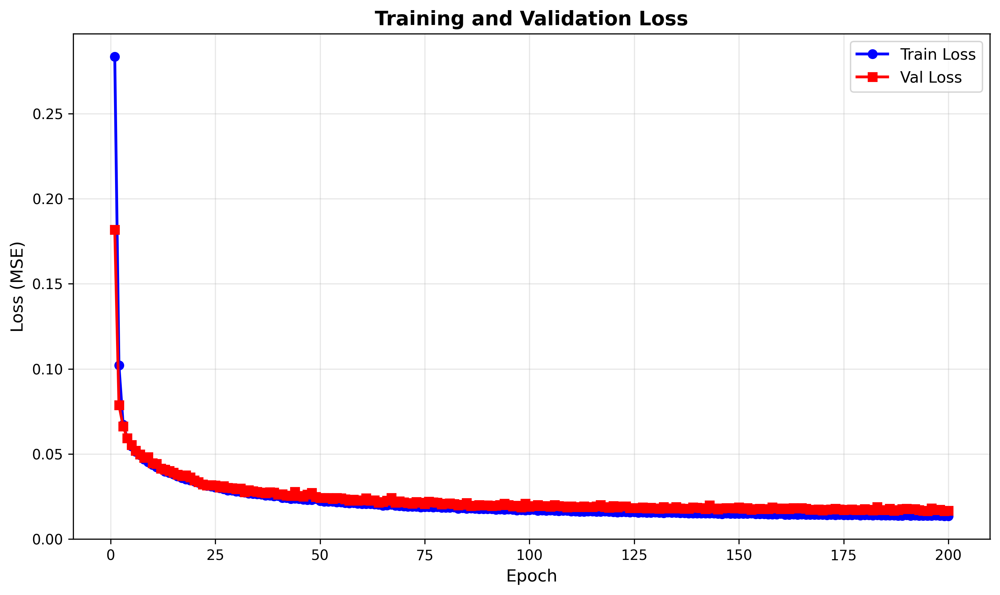


Model 2: 02_MICROnet_cnn_lstm_seq3_MSEloss_no_skip


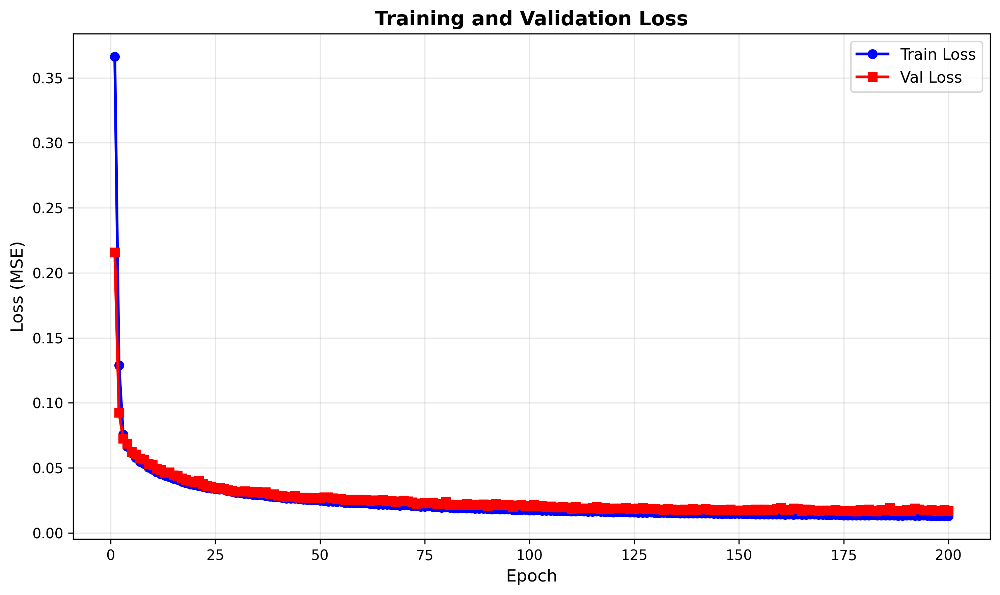


Model 3: 03_MICROnet_cnn_lstm_seq4_MSEloss_no_skip


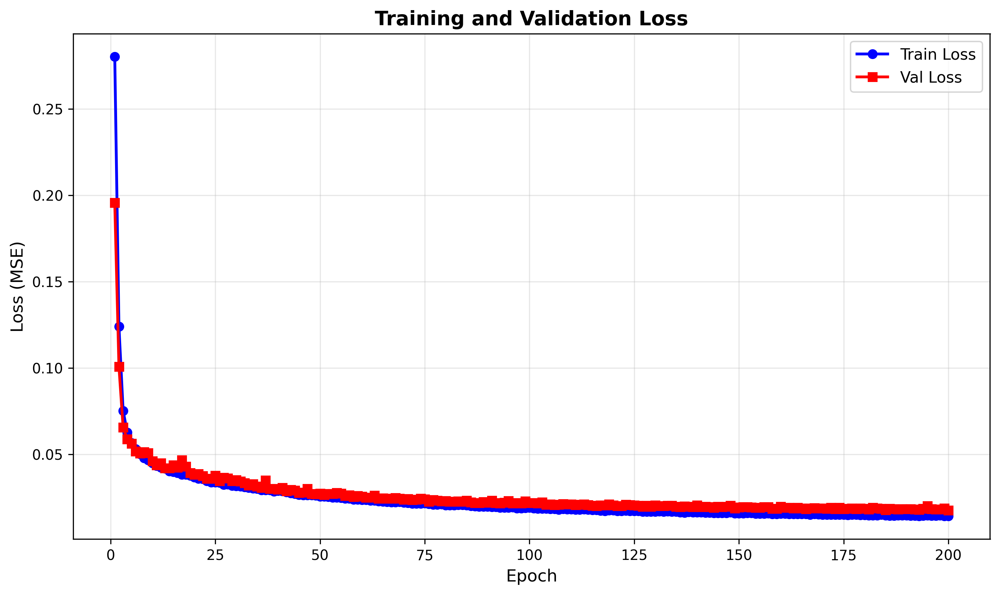


Model 4: 04_MICROnet_cnn_lstm_seq2_MSEloss


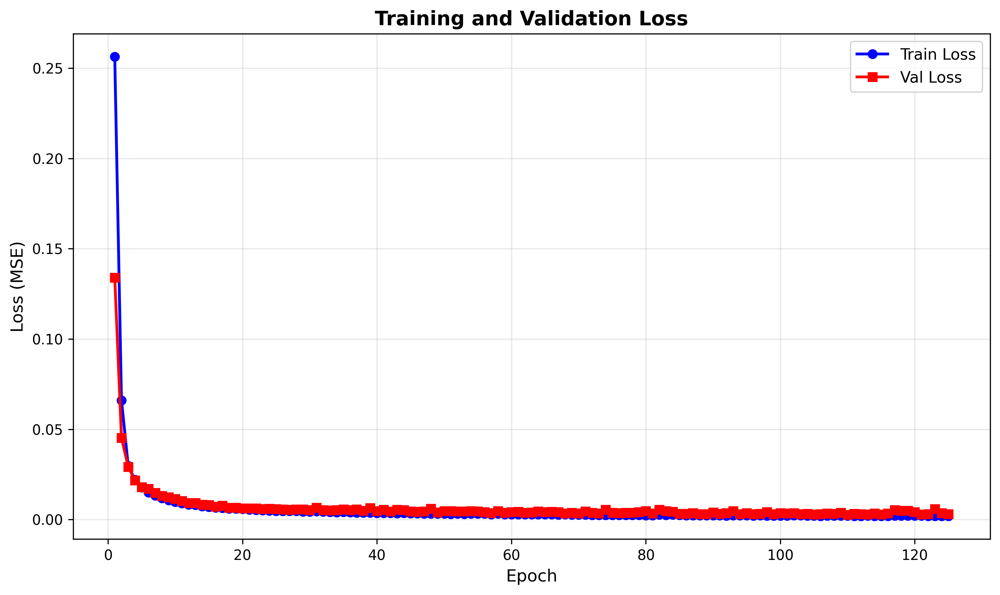


Model 5: 05_MICROnet_cnn_lstm_seq3_MSEloss


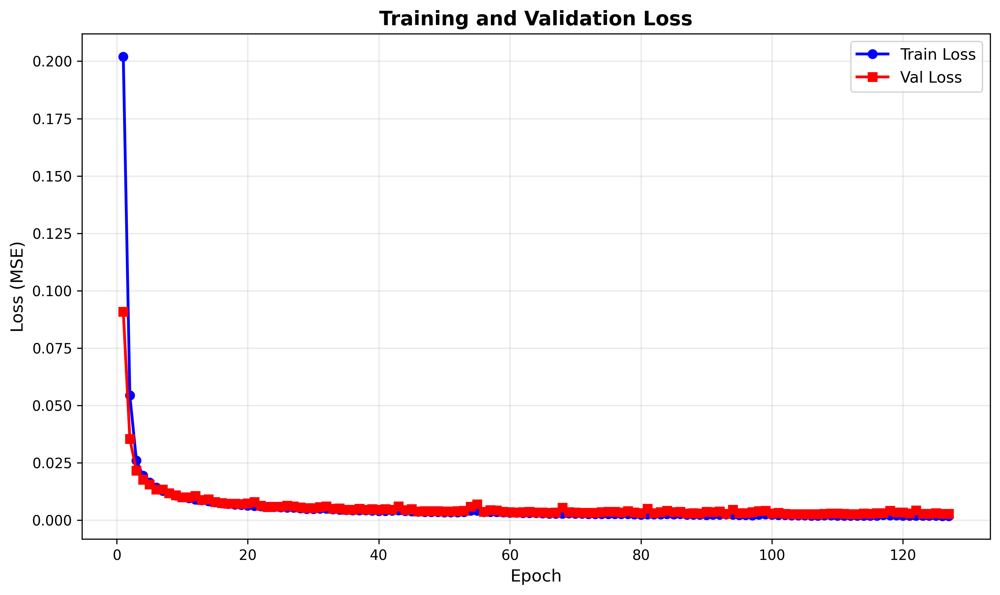


Model 6: 06_MICROnet_cnn_lstm_seq4_MSEloss


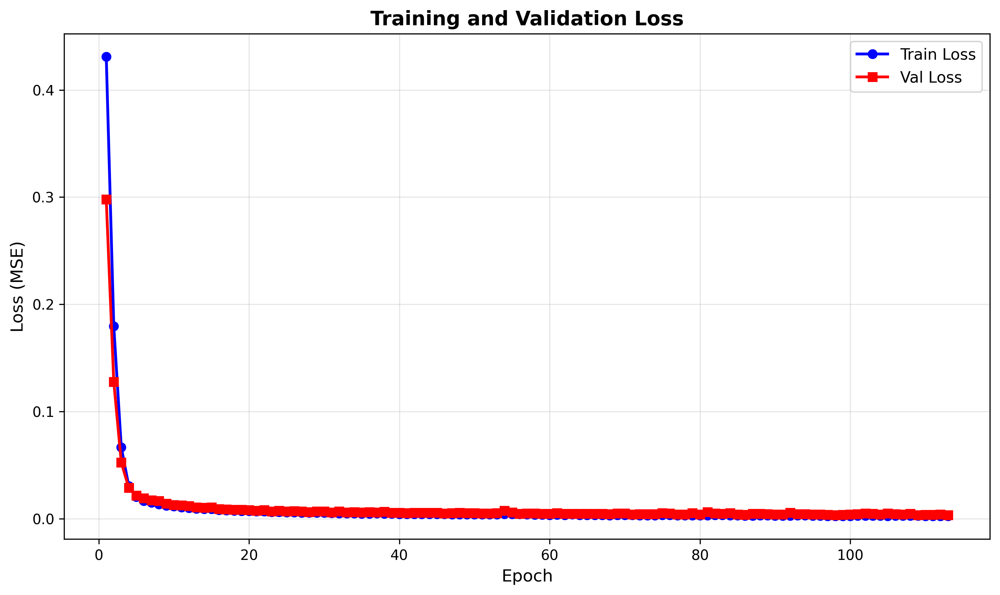


Model 7: 07_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s70_g30


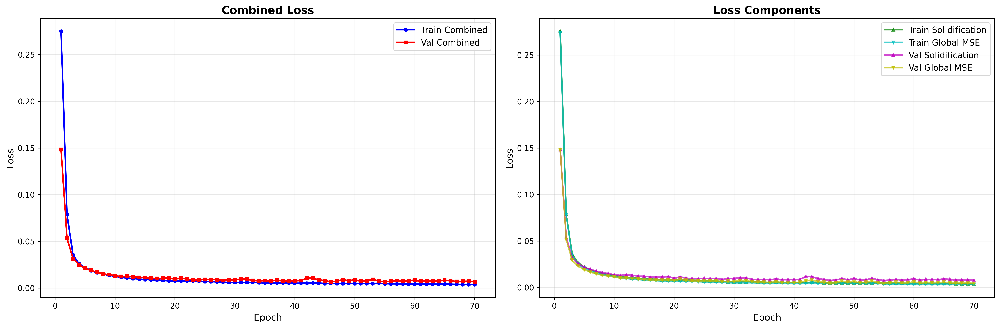


Model 8: 08_MICROnet_cnn_lstm_seq3_CombLoss_T1530-1650_s70_g30


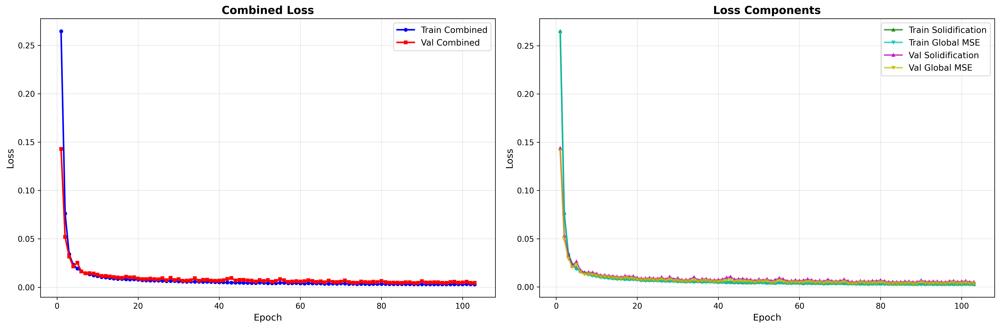


Model 9: 09_MICROnet_cnn_lstm_seq3_CombLoss_T1500-1680_s70_g30


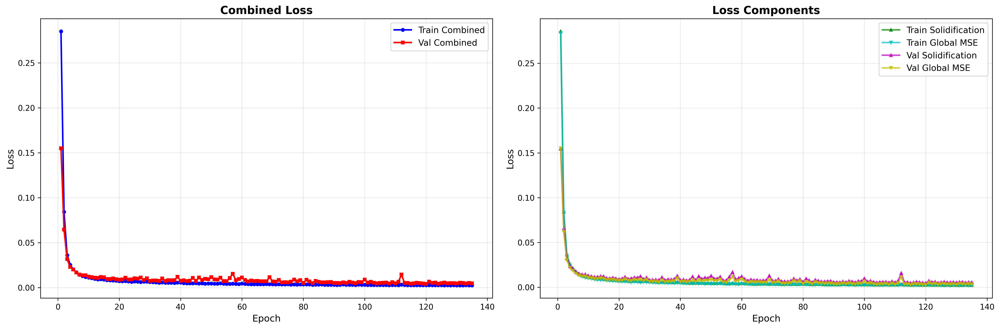


Model 10: 10_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s50_g50


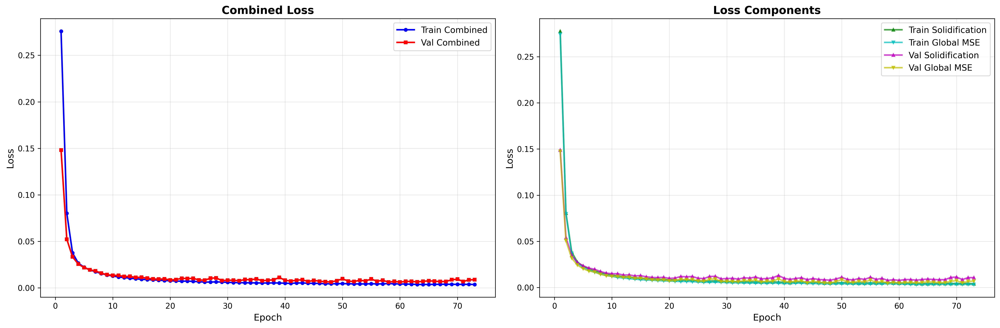


Model 11: 11_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s30_g70


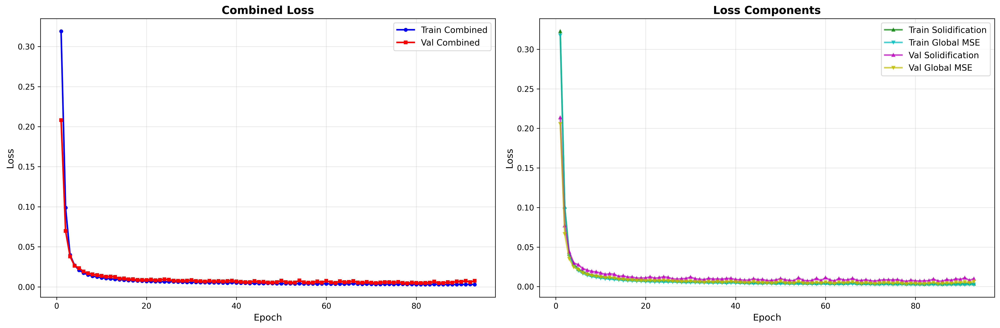


Model 12: 12_MICROnet_predrnn_seq2_MSEloss_no_skip


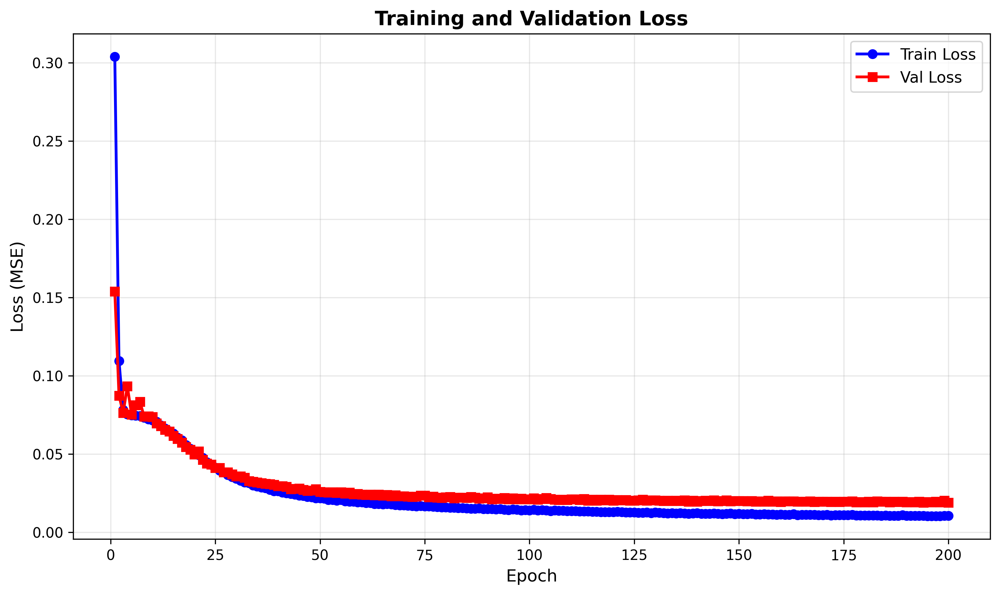


Model 13: 13_MICROnet_predrnn_seq3_MSEloss_no_skip


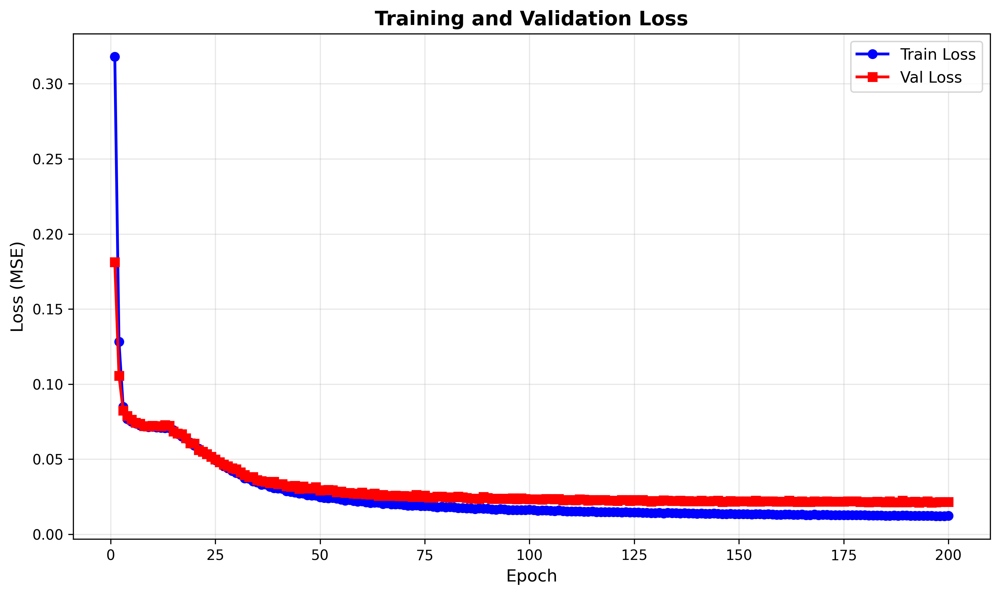


Model 14: 14_MICROnet_predrnn_seq4_MSEloss_no_skip


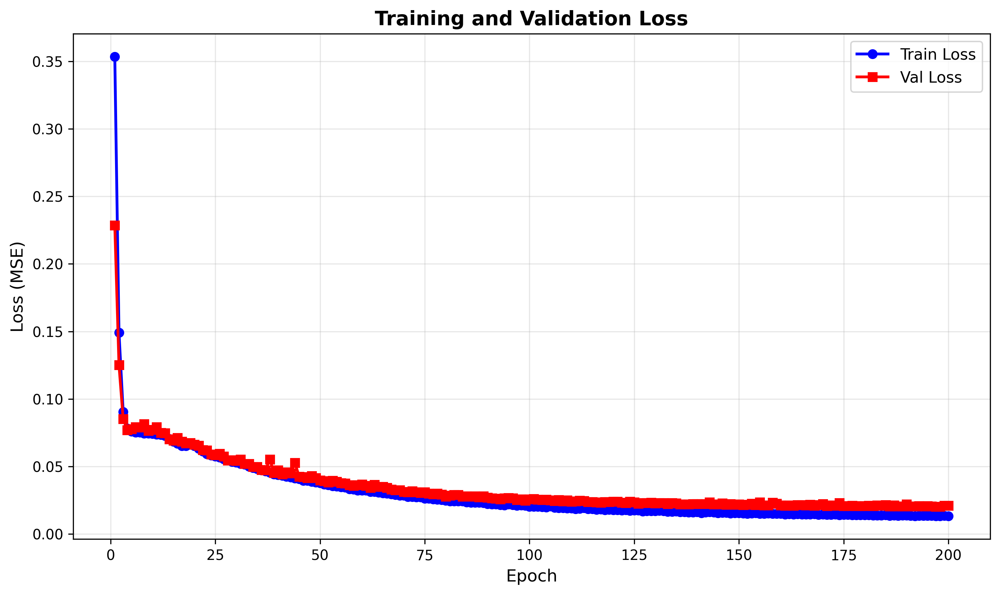


Model 15: 15_MICROnet_predrnn_seq2_MSEloss


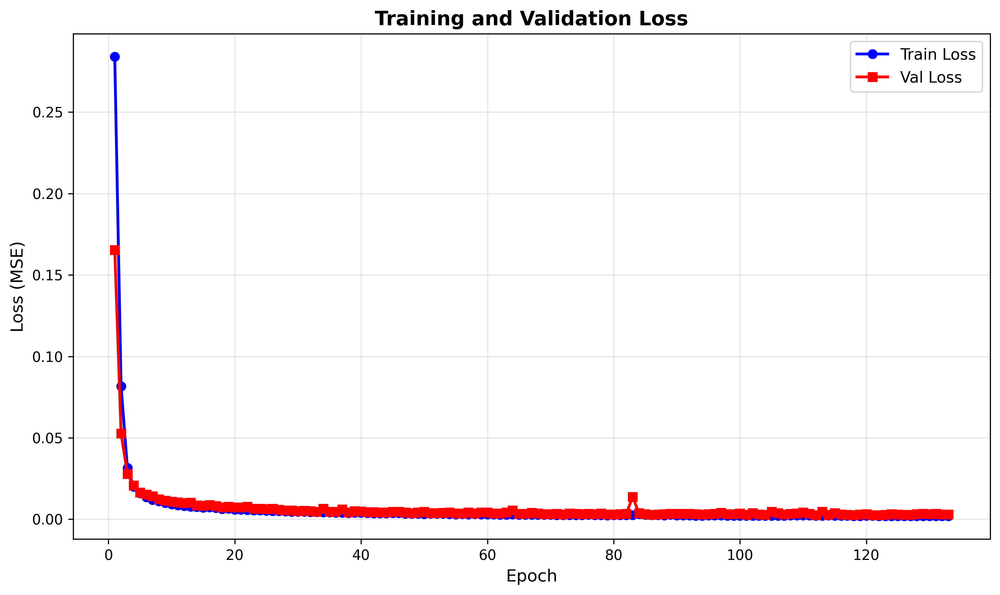


Model 16: 16_MICROnet_predrnn_seq3_MSEloss


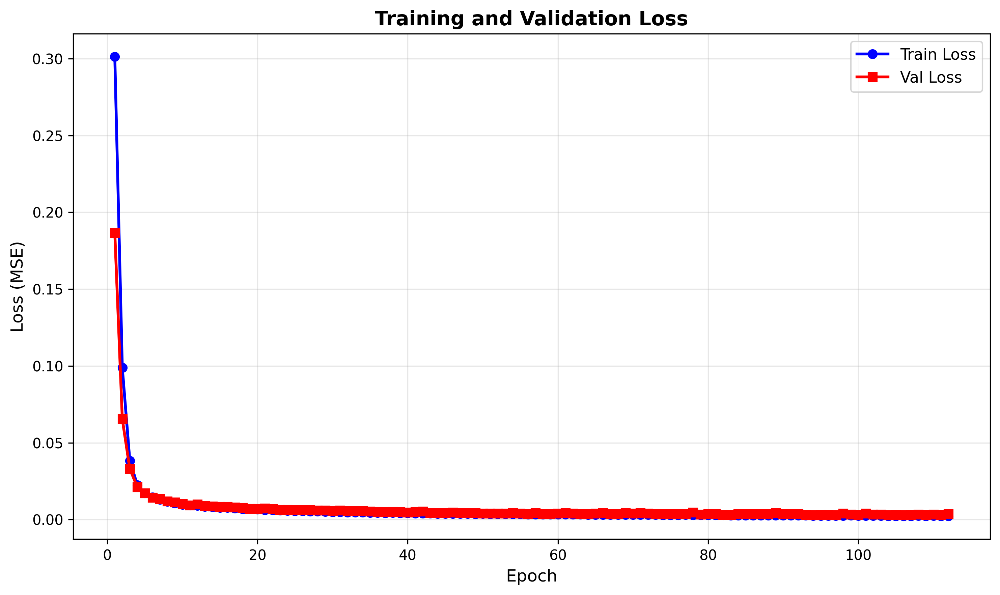


Model 17: 17_MICROnet_predrnn_seq4_MSEloss


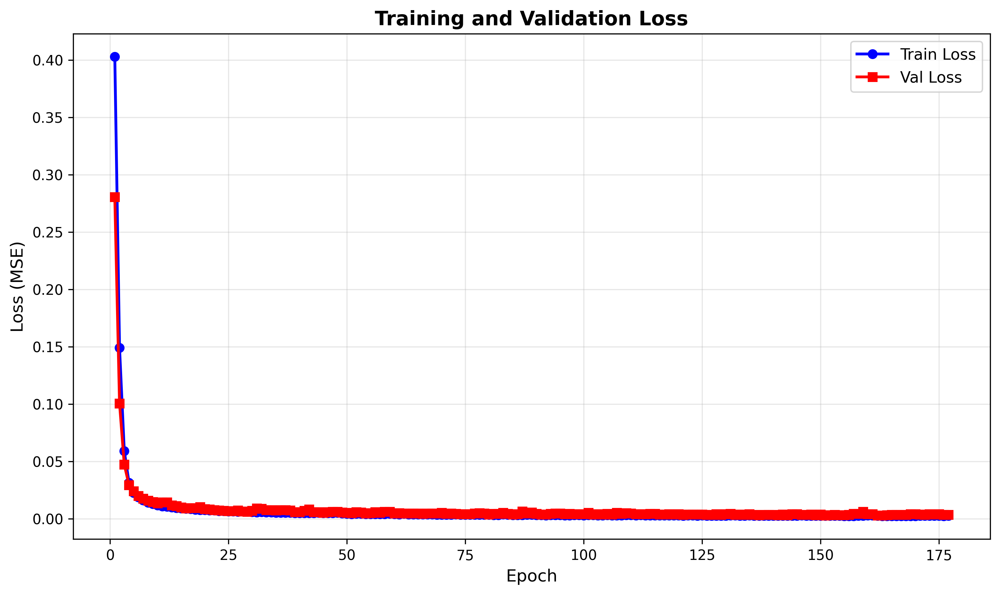


Model 18: 18_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s70_g30


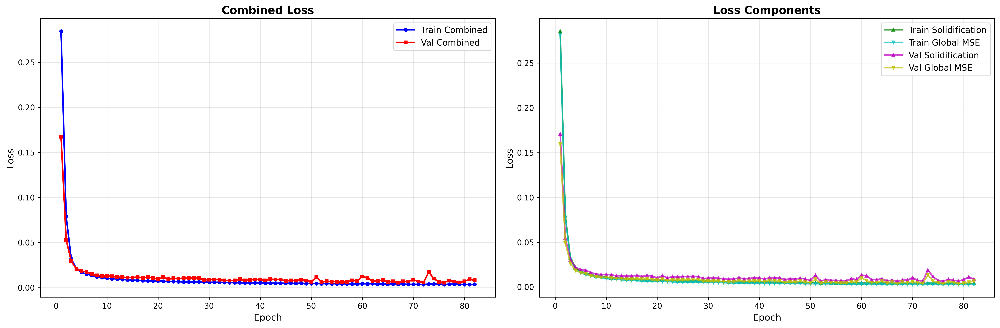


Model 19: 19_MICROnet_predrnn_seq2_CombLoss_T1530-1650_s70_g30


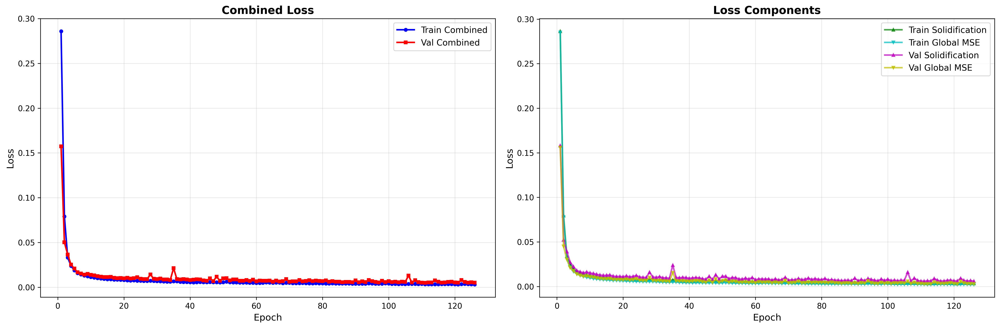


Model 20: 20_MICROnet_predrnn_seq2_CombLoss_T1500-1680_s70_g30


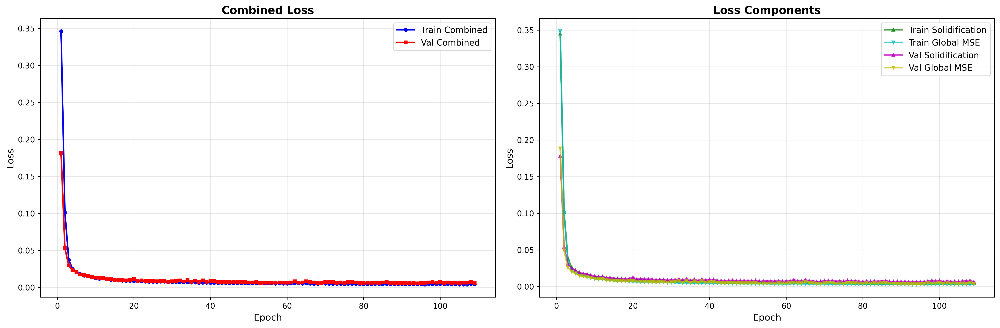


Model 21: 21_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s50_g50


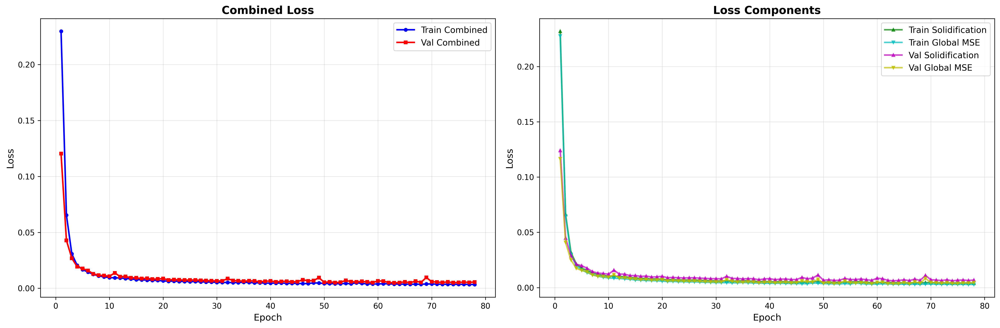


Model 22: 22_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s30_g70


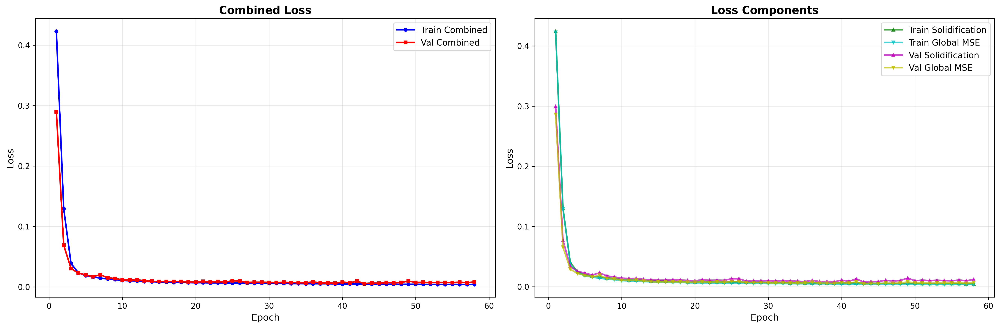

In [10]:
print("Training Loss Plots:\n")

for config in MODEL_CONFIGS:
    run_dir = OUTPUT_DIR / config['name']
    loss_plot_path = run_dir / "training_losses.png"

    if loss_plot_path.exists():
        print(f"\nModel {config['id']}: {config['name']}")
        display(Image(filename=str(loss_plot_path)))
    else:
        print(f"\nModel {config['id']}: No training losses plot found")

## Display Predictions

Display prediction visualizations for all models.

Prediction Visualizations (t=23, s=47):


Model 1: No prediction found

Model 2: No prediction found

Model 3: No prediction found

Model 4: 04_MICROnet_cnn_lstm_seq2_MSEloss


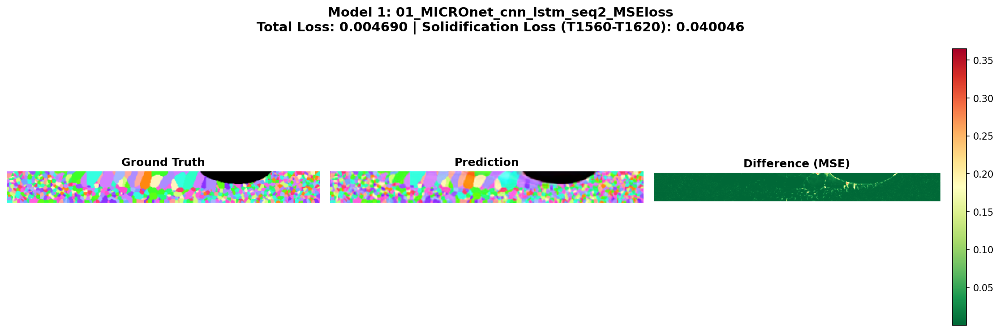


Model 5: 05_MICROnet_cnn_lstm_seq3_MSEloss


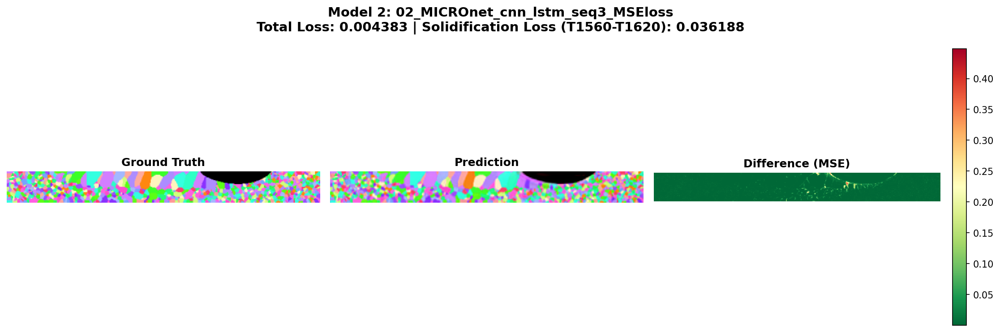


Model 6: 06_MICROnet_cnn_lstm_seq4_MSEloss


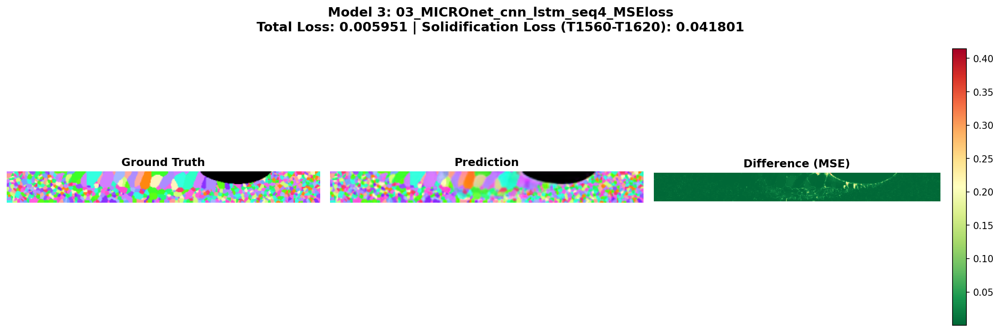


Model 7: 07_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s70_g30


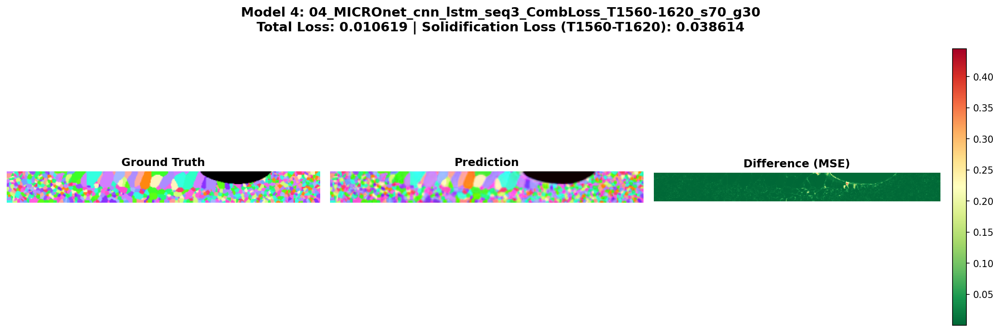


Model 8: 08_MICROnet_cnn_lstm_seq3_CombLoss_T1530-1650_s70_g30


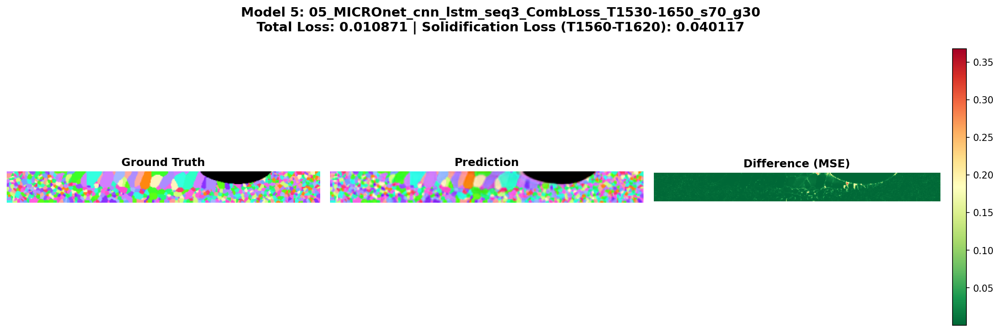


Model 9: 09_MICROnet_cnn_lstm_seq3_CombLoss_T1500-1680_s70_g30


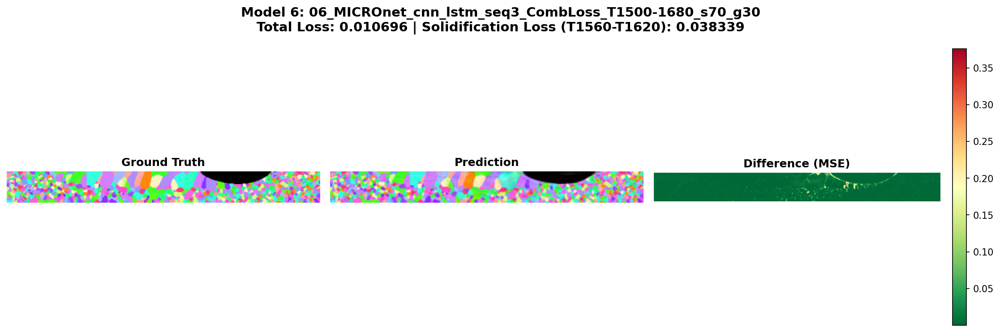


Model 10: 10_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s50_g50


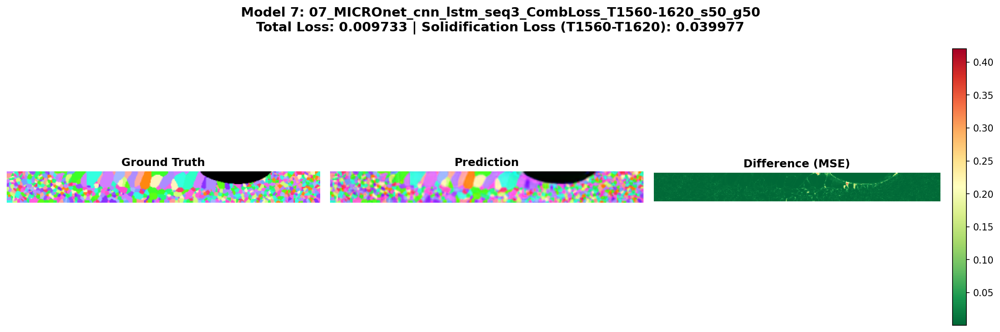


Model 11: 11_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s30_g70


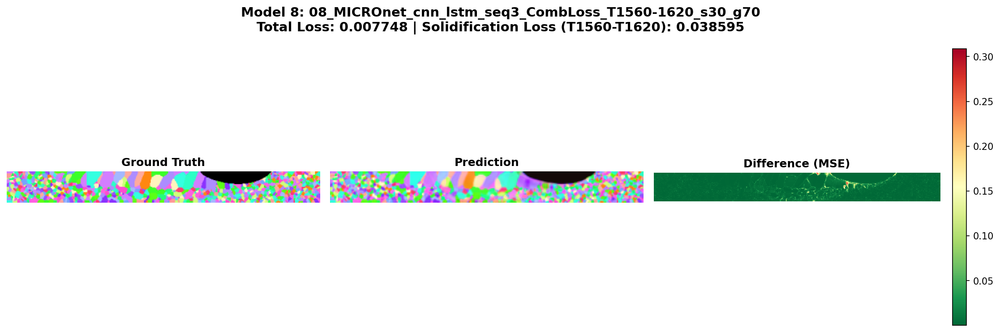


Model 12: No prediction found

Model 13: No prediction found

Model 14: No prediction found

Model 15: 15_MICROnet_predrnn_seq2_MSEloss


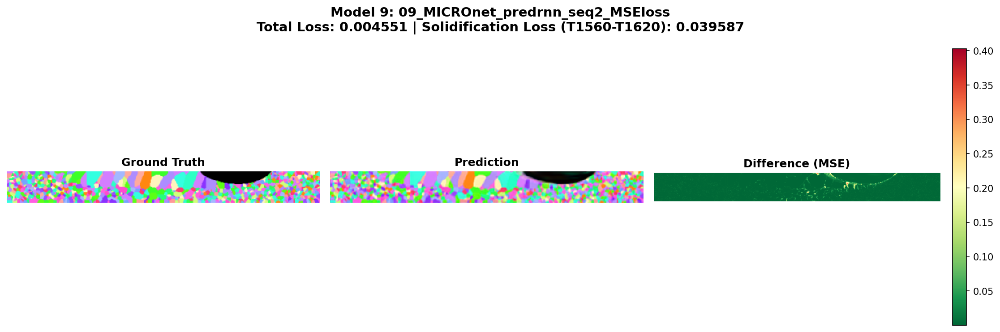


Model 16: 16_MICROnet_predrnn_seq3_MSEloss


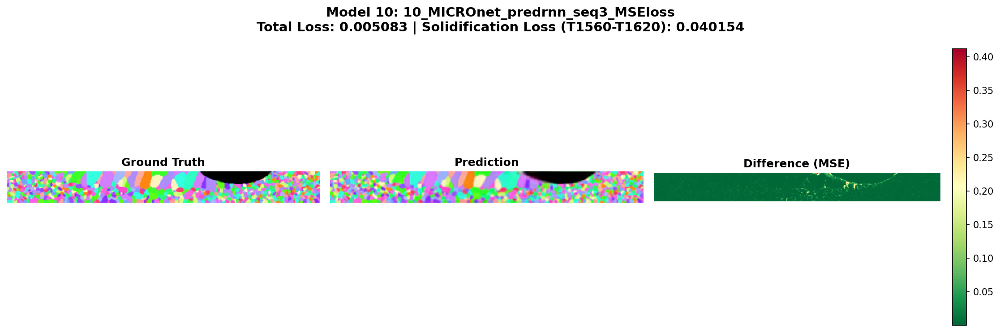


Model 17: 17_MICROnet_predrnn_seq4_MSEloss


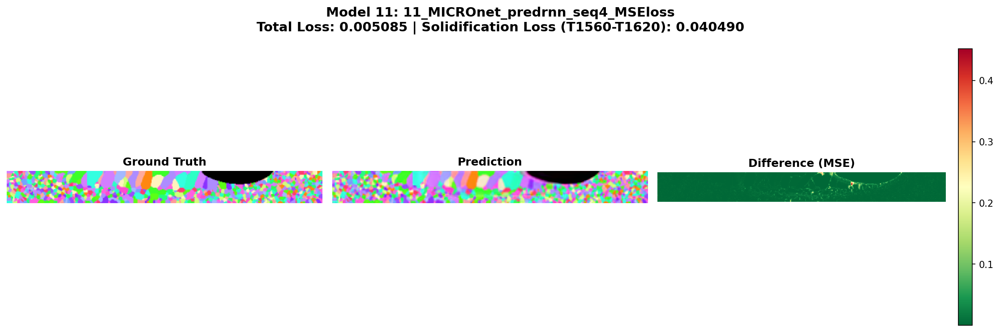


Model 18: 18_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s70_g30


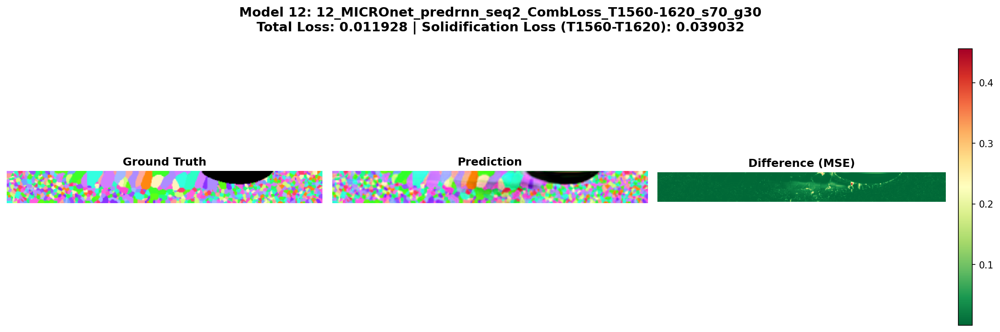


Model 19: 19_MICROnet_predrnn_seq2_CombLoss_T1530-1650_s70_g30


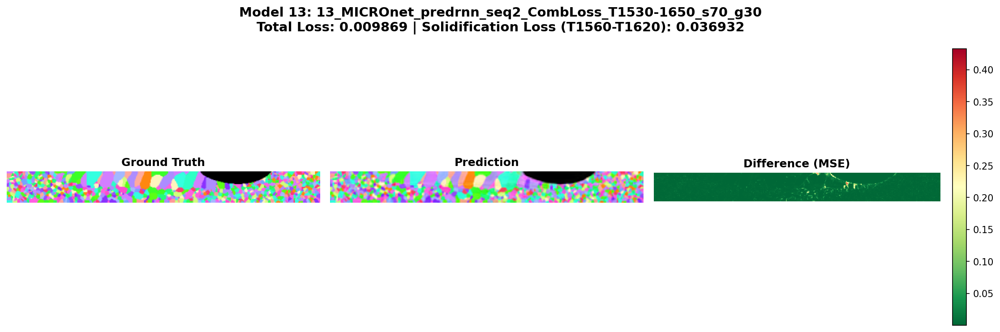


Model 20: 20_MICROnet_predrnn_seq2_CombLoss_T1500-1680_s70_g30


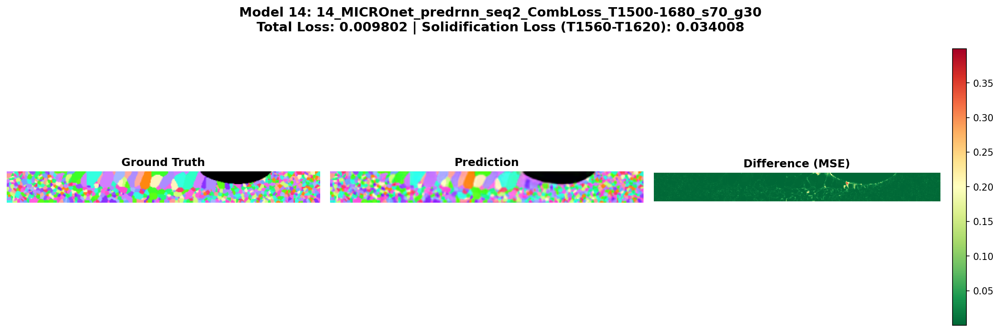


Model 21: 21_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s50_g50


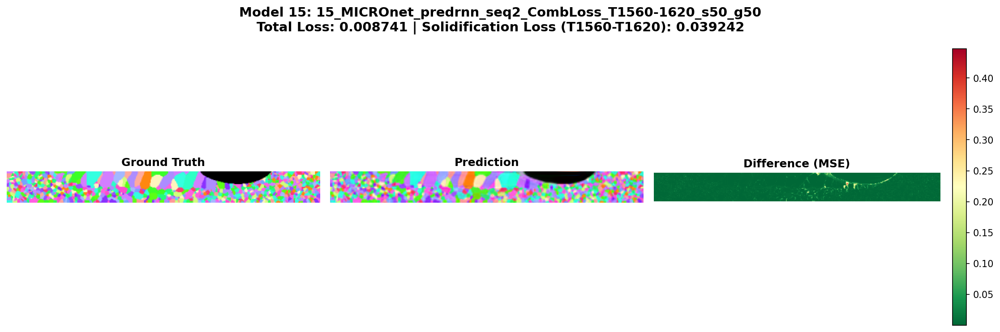


Model 22: 22_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s30_g70


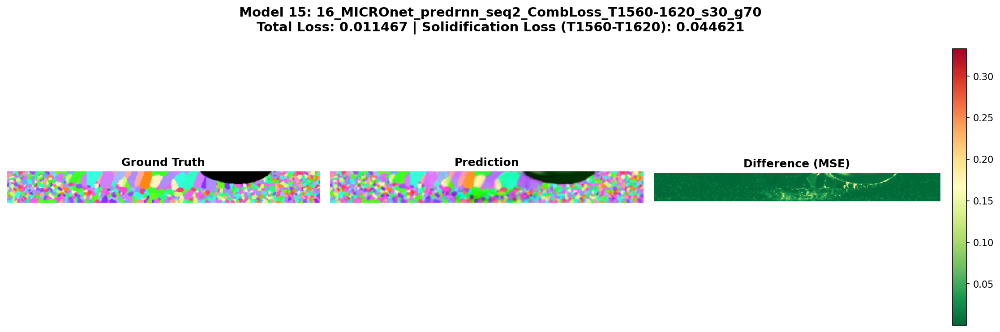

In [11]:
print(f"Prediction Visualizations (t={PRED_TIMESTEP}, s={PRED_SLICE}):\n")

for config in MODEL_CONFIGS:
    run_dir = OUTPUT_DIR / config['name']
    pred_path = run_dir / f"pred_t{PRED_TIMESTEP}_s{PRED_SLICE}.png"

    if pred_path.exists():
        print(f"\nModel {config['id']}: {config['name']}")
        display(Image(filename=str(pred_path)))
    else:
        print(f"\nModel {config['id']}: No prediction found")

## Display Solidification Mask Visualizations

Display solidification mask visualizations for models trained with combined loss.

Solidification Mask Visualizations (t=23, s=47):

(Only for models trained with combined loss)


Model 7: 07_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s70_g30


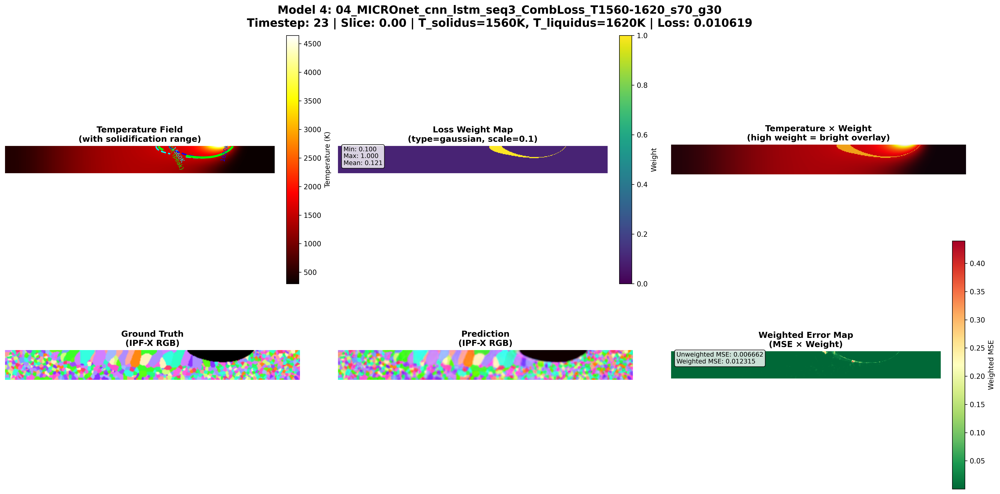


Model 8: 08_MICROnet_cnn_lstm_seq3_CombLoss_T1530-1650_s70_g30


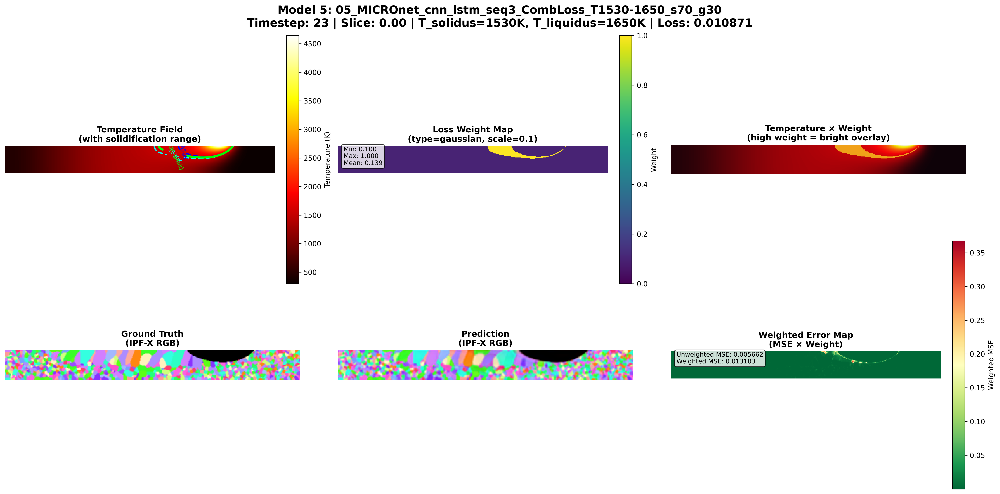


Model 9: 09_MICROnet_cnn_lstm_seq3_CombLoss_T1500-1680_s70_g30


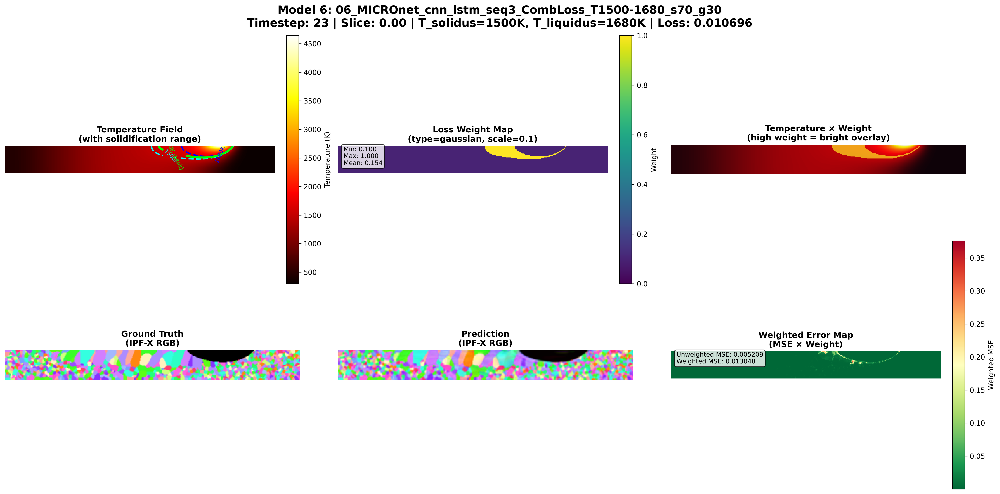


Model 10: 10_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s50_g50


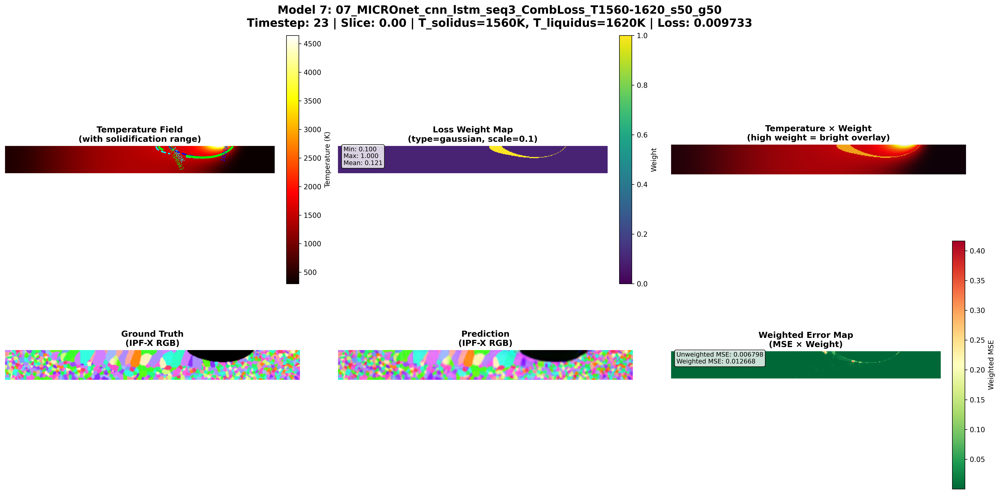


Model 11: 11_MICROnet_cnn_lstm_seq3_CombLoss_T1560-1620_s30_g70


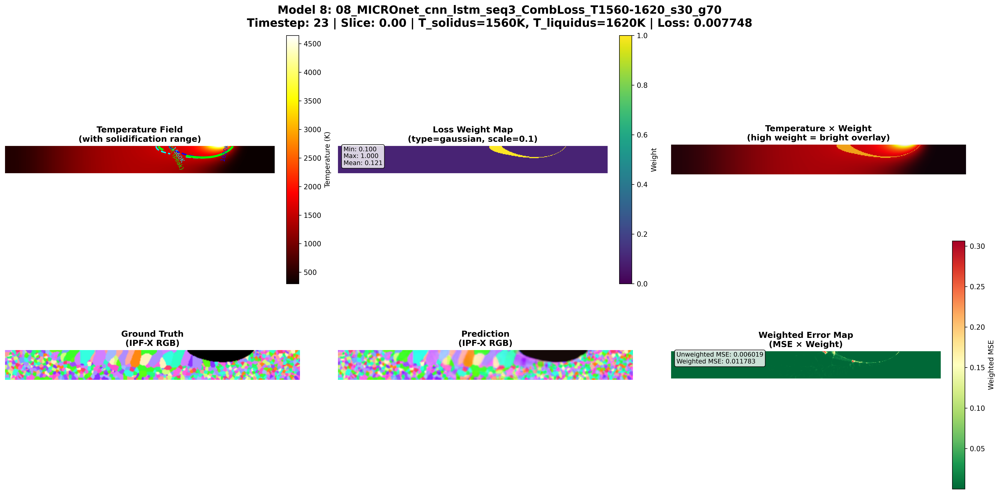


Model 18: 18_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s70_g30


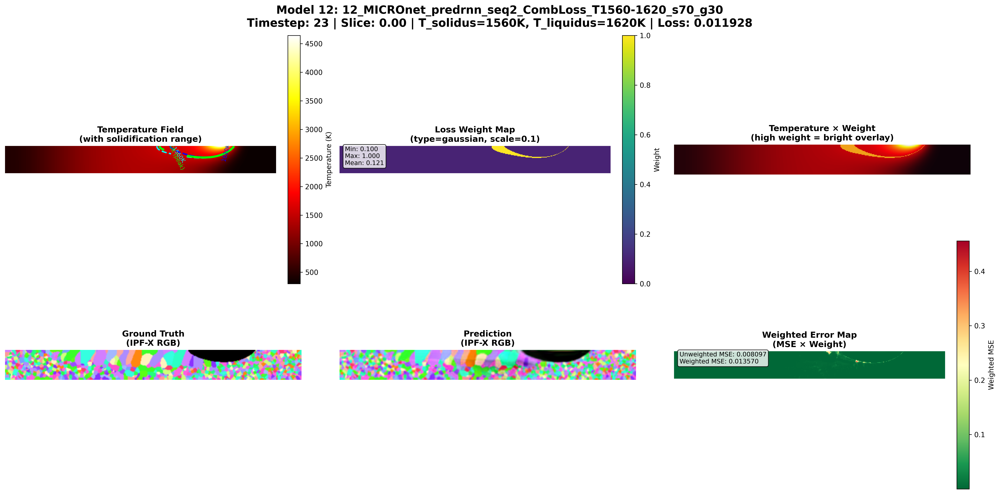


Model 19: 19_MICROnet_predrnn_seq2_CombLoss_T1530-1650_s70_g30


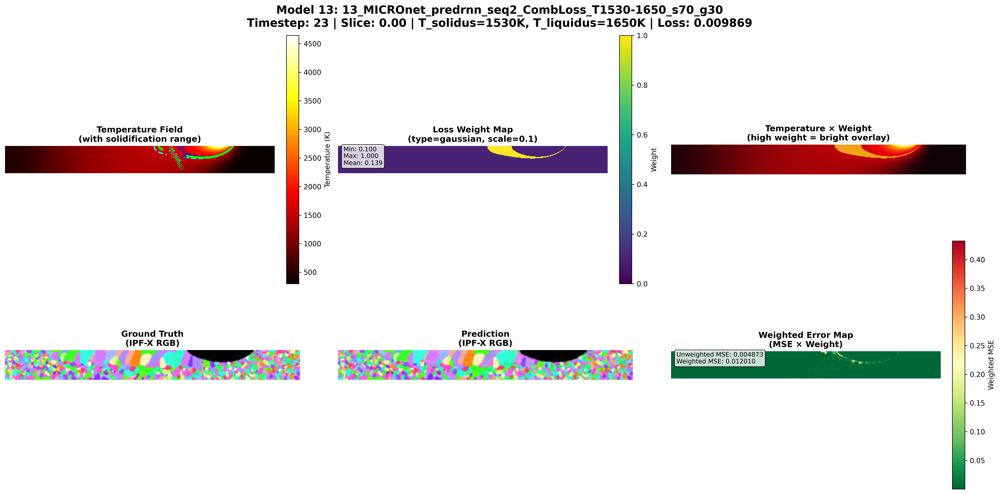


Model 20: 20_MICROnet_predrnn_seq2_CombLoss_T1500-1680_s70_g30


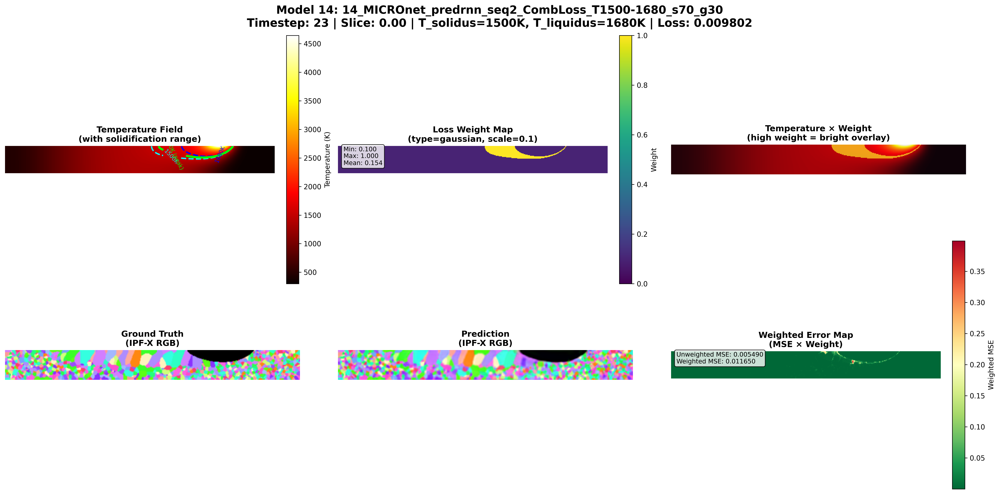


Model 21: 21_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s50_g50


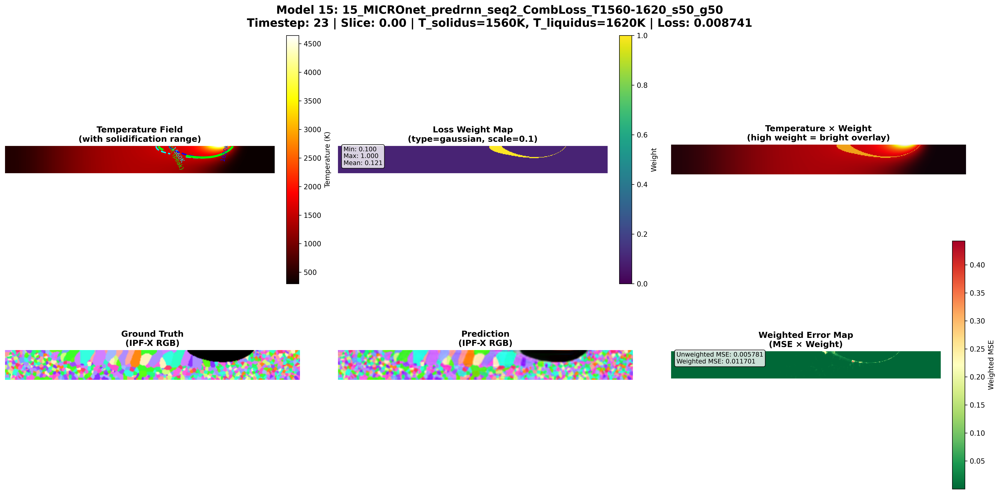


Model 22: 22_MICROnet_predrnn_seq2_CombLoss_T1560-1620_s30_g70


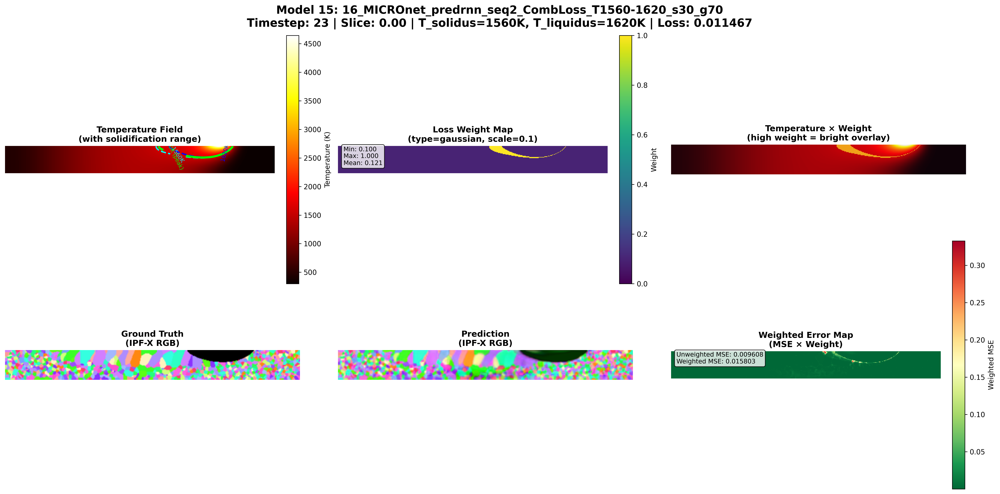

In [12]:
print(f"Solidification Mask Visualizations (t={PRED_TIMESTEP}, s={PRED_SLICE}):\n")
print("(Only for models trained with combined loss)\n")

for config in MODEL_CONFIGS:
    # Skip non-combined loss models
    if config['loss_type'] != 'combined':
        continue

    run_dir = OUTPUT_DIR / config['name']
    solid_mask_path = run_dir / f"solidification_mask_t{PRED_TIMESTEP}_s{PRED_SLICE}.png"

    if solid_mask_path.exists():
        print(f"\nModel {config['id']}: {config['name']}")
        display(Image(filename=str(solid_mask_path)))
    else:
        print(f"\nModel {config['id']}: No solidification mask found")

## Model Comparison

Compare training losses across all models.

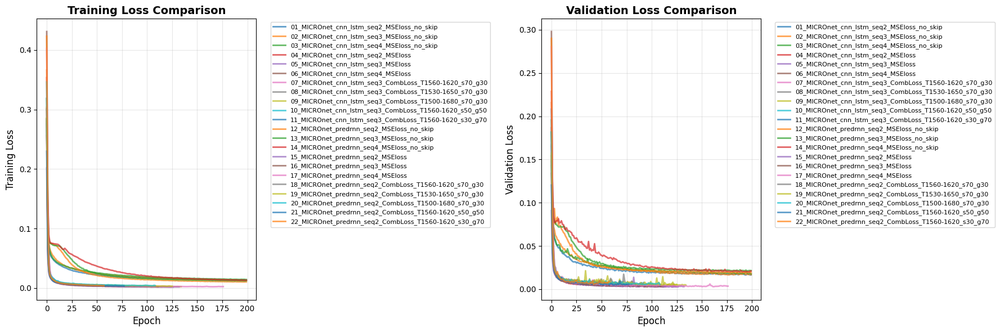


Comparison plot saved to /Users/bn/dtu/LASERNet/MicroNet_artifacts/all_models_comparison.png

Calculating solidification loss for MSE models on validation set...
  Model 1: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Solidification loss: 0.020046
  Model 2: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Solidification loss: 0.020126
  Model 3: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94



    ✓ Solidification loss: 0.021294
  Model 4: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Solidification loss: 0.005646
  Model 5: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Solidification loss: 0.005490
  Model 6: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94



    ✓ Solidification loss: 0.006253
  Model 12: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Solidification loss: 0.025464
  Model 13: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Solidification loss: 0.027430
  Model 14: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94



    ✓ Solidification loss: 0.025921
  Model 15: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Solidification loss: 0.004969
  Model 16: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Solidification loss: 0.005207
  Model 17: Computing solidification loss...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94



    ✓ Solidification loss: 0.005661

Calculating test set metrics for all models...
  Model 1: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Test MSE: 0.018980, Test Solid: 0.022415
  Model 2: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Test MSE: 0.019636, Test Solid: 0.023232
  Model 3: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94



    ✓ Test MSE: 0.020498, Test Solid: 0.024384
  Model 4: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Test MSE: 0.003172, Test Solid: 0.006328
  Model 5: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Test MSE: 0.002884, Test Solid: 0.005733
  Model 6: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data
  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94



    ✓ Test MSE: 0.004332, Test Solid: 0.007532
  Model 7: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Test MSE: 0.004993, Test Solid: 0.007926
  Model 8: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Test MSE: 0.003906, Test Solid: 0.006772
  Model 9: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Test MSE: 0.003476, Test Solid: 0.006629
  Model 10: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data
  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Test MSE: 0.005126, Test Solid: 0.007917
  Model 11: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Test MSE: 0.004491, Test Solid: 0.007376
  Model 12: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Test MSE: 0.029668, Test Solid: 0.036360
  Model 13: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Test MSE: 0.030586, Test Solid: 0.037629
  Model 14: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94



    ✓ Test MSE: 0.026787, Test Solid: 0.032924
  Model 15: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Test MSE: 0.002892, Test Solid: 0.005560
  Model 16: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188



    ✓ Test MSE: 0.003367, Test Solid: 0.005902
  Model 17: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94



    ✓ Test MSE: 0.003569, Test Solid: 0.006399
  Model 18: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Test MSE: 0.004951, Test Solid: 0.007479
  Model 19: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Test MSE: 0.003187, Test Solid: 0.005637
  Model 20: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Test MSE: 0.003973, Test Solid: 0.006274
  Model 21: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Test MSE: 0.003969, Test Solid: 0.006699
  Model 22: Computing test set metrics...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 3
  Slices: 94
  Total samples: 282



    ✓ Test MSE: 0.006496, Test Solid: 0.009353

MODEL COMPARISON SUMMARY
ID   Name                                               Train NMSE   Val NMSE     Val Solid NMSE   Test NMSE    Test Solid NMSE  Epochs  
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1    01_MICROnet_cnn_lstm_seq2_MSEloss_no_skip          0.013510     0.016581     0.020046         0.018980     0.022415         200     
2    02_MICROnet_cnn_lstm_seq3_MSEloss_no_skip          0.012927     0.016816     0.020126         0.019636     0.023232         200     
3    03_MICROnet_cnn_lstm_seq4_MSEloss_no_skip          0.014326     0.017720     0.021294         0.020498     0.024384         200     
4    04_MICROnet_cnn_lstm_seq2_MSEloss                  0.001912     0.002976     0.005646         0.003172     0.006328         125     
5    05_MICROnet_cnn_lstm_seq3_MSEloss                  0.001799  

In [13]:
# Load all histories
histories = {}
for config in MODEL_CONFIGS:
    history_path = OUTPUT_DIR / config['name'] / "history.json"
    if history_path.exists():
        with open(history_path, 'r') as f:
            histories[config['name']] = json.load(f)

if histories:
    # Plot comparison
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

    # Training loss
    for name, history in histories.items():
        ax1.plot(history['train_loss'], label=name, linewidth=2, alpha=0.7)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Training Loss', fontsize=12)
    ax1.set_title('Training Loss Comparison', fontsize=14, fontweight='bold')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    ax1.grid(True, alpha=0.3)

    # Validation loss
    for name, history in histories.items():
        ax2.plot(history['val_loss'], label=name, linewidth=2, alpha=0.7)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Validation Loss', fontsize=12)
    ax2.set_title('Validation Loss Comparison', fontsize=14, fontweight='bold')
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    comparison_path = OUTPUT_DIR / "all_models_comparison.png"
    plt.savefig(comparison_path, dpi=150, bbox_inches='tight')
    plt.show()

    print(f"\nComparison plot saved to {comparison_path}")

    # Calculate solidification loss for MSE models on validation set
    print("\nCalculating solidification loss for MSE models on validation set...")

    # Create a CombinedLoss function for solidification region evaluation (T_solidus=1560, T_liquidus=1620)
    solidification_loss_fn = CombinedLoss(
        solidification_weight=1.0,
        global_weight=0.0,
        T_solidus=1560.0,
        T_liquidus=1620.0,
        weight_type="gaussian",
        weight_scale=0.1,
        base_weight=0.1,
        return_components=True,
    )

    mse_solidification_losses = {}

    for config in MODEL_CONFIGS:
        if config['loss_type'] == 'mse':
            checkpoint_path = OUTPUT_DIR / config['name'] / "checkpoints" / "best_model.pt"

            if checkpoint_path.exists():
                print(f"  Model {config['id']}: Computing solidification loss...")

                # Load model
                checkpoint = torch.load(checkpoint_path, map_location=DEVICE)

                if config['model_type'] == 'cnn_lstm':
                    model = MicrostructureCNN_LSTM(
                        input_channels=10,
                        future_channels=1,
                        output_channels=9,
                        use_skip_connections=config.get('use_skip_connections', False),
                    ).to(DEVICE)
                else:  # predrnn
                    model = MicrostructurePredRNN(
                        input_channels=10,
                        future_channels=1,
                        output_channels=9,
                        use_skip_connections=config.get('use_skip_connections', False),
                    ).to(DEVICE)

                model.load_state_dict(checkpoint['model_state_dict'])
                model.eval()

                # Create validation dataset with correct sequence length
                if fast_loading_available:
                    eval_dataset = FastMicrostructureSequenceDataset(
                        plane=PLANE,
                        split="val",
                        sequence_length=config['seq_length'],
                        target_offset=1,
                        train_ratio=train_ratio,
                        val_ratio=val_ratio,
                        test_ratio=test_ratio,
                    )
                else:
                    eval_dataset = MicrostructureSequenceDataset(
                        plane=PLANE,
                        split="val",
                        sequence_length=config['seq_length'],
                        target_offset=1,
                        preload=True,
                        train_ratio=train_ratio,
                        val_ratio=val_ratio,
                        test_ratio=test_ratio,
                    )

                eval_loader = DataLoader(eval_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

                # Evaluate on validation set
                total_solid_loss = 0.0
                num_batches = 0

                with torch.no_grad():
                    for batch in eval_loader:
                        context_temp = batch['context_temp'].to(DEVICE)
                        context_micro = batch['context_micro'].to(DEVICE)
                        future_temp = batch['future_temp'].to(DEVICE)
                        target_micro = batch['target_micro'].to(DEVICE)
                        mask = batch['target_mask'].to(DEVICE)

                        # Concatenate context temperature and microstructure
                        context = torch.cat([context_temp, context_micro], dim=2)

                        # Forward pass
                        pred_micro = model(context, future_temp)

                        # Calculate solidification loss
                        total_loss, solid_loss, global_loss = solidification_loss_fn(pred_micro, target_micro, future_temp, mask)

                        total_solid_loss += solid_loss.item()
                        num_batches += 1

                avg_solid_loss = total_solid_loss / num_batches
                mse_solidification_losses[config['name']] = avg_solid_loss
                print(f"    ✓ Solidification loss: {avg_solid_loss:.6f}")

    # Calculate test set metrics for all models
    print("\nCalculating test set metrics for all models...")

    test_mse_losses = {}
    test_solid_losses = {}

    mse_loss_fn = nn.MSELoss()

    for config in MODEL_CONFIGS:
        checkpoint_path = OUTPUT_DIR / config['name'] / "checkpoints" / "best_model.pt"

        if checkpoint_path.exists():
            print(f"  Model {config['id']}: Computing test set metrics...")

            # Load model
            checkpoint = torch.load(checkpoint_path, map_location=DEVICE)

            if config['model_type'] == 'cnn_lstm':
                model = MicrostructureCNN_LSTM(
                    input_channels=10,
                    future_channels=1,
                    output_channels=9,
                    use_skip_connections=config.get('use_skip_connections', False),
                ).to(DEVICE)
            else:  # predrnn
                model = MicrostructurePredRNN(
                    input_channels=10,
                    future_channels=1,
                    output_channels=9,
                    use_skip_connections=config.get('use_skip_connections', False),
                ).to(DEVICE)

            model.load_state_dict(checkpoint['model_state_dict'])
            model.eval()

            # Create test dataset with correct sequence length
            if fast_loading_available:
                test_dataset = FastMicrostructureSequenceDataset(
                    plane=PLANE,
                    split="test",
                    sequence_length=config['seq_length'],
                    target_offset=1,
                    train_ratio=train_ratio,
                    val_ratio=val_ratio,
                    test_ratio=test_ratio,
                )
            else:
                test_dataset = MicrostructureSequenceDataset(
                    plane=PLANE,
                    split="test",
                    sequence_length=config['seq_length'],
                    target_offset=1,
                    preload=True,
                    train_ratio=train_ratio,
                    val_ratio=val_ratio,
                    test_ratio=test_ratio,
                )

            test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

            # Evaluate on test set
            total_mse_loss = 0.0
            total_solid_loss = 0.0
            num_batches = 0

            with torch.no_grad():
                for batch in test_loader:
                    context_temp = batch['context_temp'].to(DEVICE)
                    context_micro = batch['context_micro'].to(DEVICE)
                    future_temp = batch['future_temp'].to(DEVICE)
                    target_micro = batch['target_micro'].to(DEVICE)
                    mask = batch['target_mask'].to(DEVICE)

                    # Concatenate context
                    context = torch.cat([context_temp, context_micro], dim=2)

                    # Forward pass
                    pred_micro = model(context, future_temp)

                    # Calculate MSE loss (on valid pixels only)
                    mask_expanded = mask.unsqueeze(1).expand_as(pred_micro)
                    squared_error = (pred_micro - target_micro) ** 2
                    valid_squared_error = squared_error[mask_expanded].sum()
                    valid_pixels = mask_expanded.sum()
                    mse_loss = valid_squared_error / valid_pixels

                    # Calculate solidification loss
                    _, solid_loss, _ = solidification_loss_fn(pred_micro, target_micro, future_temp, mask)

                    total_mse_loss += mse_loss.item()
                    total_solid_loss += solid_loss.item()
                    num_batches += 1

            avg_mse_loss = total_mse_loss / num_batches
            avg_solid_loss = total_solid_loss / num_batches

            test_mse_losses[config['name']] = avg_mse_loss
            test_solid_losses[config['name']] = avg_solid_loss

            print(f"    ✓ Test MSE: {avg_mse_loss:.6f}, Test Solid: {avg_solid_loss:.6f}")

    # Print summary table with NMSE (Normalized Mean Squared Error)
    print("\n" + "="*170)
    print("MODEL COMPARISON SUMMARY")
    print("="*170)
    print(f"{'ID':<4} {'Name':<50} {'Train NMSE':<12} {'Val NMSE':<12} {'Val Solid NMSE':<16} {'Test NMSE':<12} {'Test Solid NMSE':<16} {'Epochs':<8}")
    print("-"*170)

    for config in MODEL_CONFIGS:
        name = config['name']
        if name in histories:
            history = histories[name]
            final_train = history['train_loss'][-1]
            final_val = history['val_loss'][-1]
            epochs = len(history['train_loss'])

            # Val solidification loss
            if config['loss_type'] == 'combined' and 'val_solidification_loss' in history:
                final_val_solid = history['val_solidification_loss'][-1]
            elif config['loss_type'] == 'mse' and name in mse_solidification_losses:
                final_val_solid = mse_solidification_losses[name]
            else:
                final_val_solid = None

            # Test losses
            test_mse = test_mse_losses.get(name, None)
            test_solid = test_solid_losses.get(name, None)

            # Format output
            val_solid_str = f"{final_val_solid:.6f}" if final_val_solid is not None else "N/A"
            test_global_str = f"{test_mse:.6f}" if test_mse is not None else "N/A"
            test_solid_str = f"{test_solid:.6f}" if test_solid is not None else "N/A"

            print(f"{config['id']:<4} {name:<50} {final_train:<12.6f} {final_val:<12.6f} {val_solid_str:<16} {test_global_str:<12} {test_solid_str:<16} {epochs:<8}")
        else:
            print(f"{config['id']:<4} {name:<50} {'N/A':<12} {'N/A':<12} {'N/A':<16} {'N/A':<12} {'N/A':<16} {'N/A':<8}")

    print("="*170)
else:
    print("No training histories found.")

## Summary

All 10 models have been trained and evaluated!

In [14]:
## Cascaded Prediction Evaluation

# Load temperature prediction model
print("="*80)
print("CASCADED PREDICTION EVALUATION")
print("="*80)
print("\n1. Loading TempNet model...")

tempnet_checkpoint_path = project_root / "TempNet_artifacts/T07_seq2_lr5e-4_2layers/checkpoints/best_model.pt"
if not tempnet_checkpoint_path.exists():
    raise FileNotFoundError(f"TempNet checkpoint not found at {tempnet_checkpoint_path}")

from lasernet.model.CNN_LSTM import CNN_LSTM

# Load TempNet checkpoint
tempnet_ckpt = torch.load(tempnet_checkpoint_path, map_location=DEVICE)

# Check checkpoint structure and extract config
if 'config' in tempnet_ckpt:
    tempnet_full_config = tempnet_ckpt['config']
    tempnet_config = tempnet_full_config.get('experiment', tempnet_full_config)
    tempnet_temp_range = tempnet_full_config.get('temp_range', (300.0, 4555.77))
    print(f"  TempNet config: seq_length={tempnet_config['sequence_length']}, lstm_layers={tempnet_config['lstm_layers']}")
else:
    print("  Note: Checkpoint has old format, using defaults")
    tempnet_config = {
        'sequence_length': 2,
        'hidden_channels': [16, 32, 64],
        'lstm_hidden': 64,
        'lstm_layers': 2,  # T07 checkpoint has 2 layers
    }
    tempnet_temp_range = (300.0, 4555.77)
    print(f"  TempNet config: seq_length={tempnet_config['sequence_length']}, lstm_layers={tempnet_config['lstm_layers']}")

# Create TempNet model
tempnet_model = CNN_LSTM(
    input_channels=1,
    hidden_channels=tempnet_config['hidden_channels'],
    lstm_hidden=tempnet_config['lstm_hidden'],
    lstm_layers=tempnet_config['lstm_layers'],
    temp_range=tuple(tempnet_temp_range),
).to(DEVICE)

tempnet_model.load_state_dict(tempnet_ckpt['model_state_dict'])
tempnet_model.eval()
print(f"✓ TempNet loaded from {tempnet_checkpoint_path}")
print(f"  Sequence length: {tempnet_config['sequence_length']}")
print(f"  Temperature range: {tempnet_temp_range}")

# Load microstructure prediction model
print("\n2. Loading MICROnet model...")
micronet_checkpoint_path = OUTPUT_DIR / "05_MICROnet_cnn_lstm_seq3_MSEloss/checkpoints/best_model.pt"
if not micronet_checkpoint_path.exists():
    raise FileNotFoundError(f"MICROnet checkpoint not found at {micronet_checkpoint_path}")

micronet_ckpt = torch.load(micronet_checkpoint_path, map_location=DEVICE)

# Check checkpoint structure and extract config
if 'config' in micronet_ckpt:
    micronet_full_config = micronet_ckpt['config']
    micronet_seq_length = micronet_full_config.get('model', {}).get('sequence_length', 3)
    micronet_use_skip = micronet_full_config.get('model', {}).get('use_skip_connections', False)
else:
    print("  Note: Checkpoint has old format, inferring from model name")
    # Infer from checkpoint path: "05_MICROnet_cnn_lstm_seq3_MSEloss"
    micronet_seq_length = 3  # seq3 from the name
    micronet_use_skip = True  # Default for trained models

print(f"  MICROnet config: seq_length={micronet_seq_length}, use_skip_connections={micronet_use_skip}")

# Create MICROnet model
micronet_model = MicrostructureCNN_LSTM(
    input_channels=10,
    future_channels=1,
    output_channels=9,
    use_skip_connections=micronet_use_skip,
).to(DEVICE)

micronet_model.load_state_dict(micronet_ckpt['model_state_dict'])
micronet_model.eval()
print(f"✓ MICROnet loaded from {micronet_checkpoint_path}")
print(f"  Sequence length: {micronet_seq_length}")

# Create test dataset that works for both models
print("\n3. Creating test dataset...")
test_dataset_cascaded = FastMicrostructureSequenceDataset(
    plane=PLANE,
    split="test",
    sequence_length=micronet_seq_length,
    target_offset=1,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    test_ratio=test_ratio,
)

test_loader_cascaded = DataLoader(
    test_dataset_cascaded,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
)

print(f"✓ Test dataset created with {len(test_dataset_cascaded)} samples")

# Evaluate cascaded prediction
print("\n4. Running cascaded predictions on test set...")
print("  This uses predicted temperatures (TempNet) as input to MICROnet")

total_loss = 0.0
total_pixels = 0

with torch.no_grad():
    for batch_idx, batch in enumerate(test_loader_cascaded):
        context_temp = batch['context_temp'].to(DEVICE)  # [B, seq, 1, H, W]
        context_micro = batch['context_micro'].to(DEVICE)  # [B, seq, 9, H, W]
        future_temp_gt = batch['future_temp'].to(DEVICE)  # [B, 1, H, W]
        target_micro = batch['target_micro'].to(DEVICE)  # [B, 9, H, W]
        mask = batch['target_mask'].to(DEVICE)  # [B, H, W]

        batch_size = context_temp.shape[0]
        seq_len = context_temp.shape[1]

        # Step 1: Predict future temperature using TempNet
        if tempnet_config['sequence_length'] == seq_len:
            temp_input = context_temp
        elif tempnet_config['sequence_length'] < seq_len:
            temp_input = context_temp[:, -tempnet_config['sequence_length']:]
        else:
            print(f"  Warning: Batch {batch_idx} skipped - TempNet needs {tempnet_config['sequence_length']} frames, only have {seq_len}")
            continue

        # Predict temperature [B, 1, H, W]
        future_temp_pred = tempnet_model(temp_input)

        # Step 2: Use predicted temperature to predict microstructure
        context = torch.cat([context_temp, context_micro], dim=2)  # [B, seq, 10, H, W]

        # Predict microstructure using PREDICTED temperature
        pred_micro = micronet_model(context, future_temp_pred)  # [B, 9, H, W]

        # Calculate loss on valid pixels only
        # Expand mask to match microstructure channels: [B, H, W] -> [B, 9, H, W]
        mask_expanded = mask.unsqueeze(1).expand_as(pred_micro)  # [B, 9, H, W]

        # Calculate squared error per pixel
        squared_error = (pred_micro - target_micro) ** 2  # [B, 9, H, W]

        # Sum squared error over valid pixels only
        valid_squared_error = squared_error[mask_expanded].sum()
        valid_pixels = mask_expanded.sum()

        total_loss += valid_squared_error.item()
        total_pixels += valid_pixels.item()

        if (batch_idx + 1) % 10 == 0:
            print(f"  Processed {batch_idx + 1}/{len(test_loader_cascaded)} batches...")

avg_loss = total_loss / total_pixels if total_pixels > 0 else float('inf')

print("\n" + "="*80)
print("CASCADED PREDICTION RESULTS")
print("="*80)
print(f"Average MSE Loss on Test Set: {avg_loss:.6f}")
print(f"Total valid pixels: {total_pixels:,}")
print(f"Total batches processed: {batch_idx + 1}")
print("\nThis loss represents the microstructure prediction error when using")
print("PREDICTED temperatures (from TempNet) instead of ground truth temperatures.")
print("="*80)

CASCADED PREDICTION EVALUATION

1. Loading TempNet model...
  Note: Checkpoint has old format, using defaults
  TempNet config: seq_length=2, lstm_layers=2
✓ TempNet loaded from /Users/bn/dtu/LASERNet/TempNet_artifacts/T07_seq2_lr5e-4_2layers/checkpoints/best_model.pt
  Sequence length: 2
  Temperature range: (300.0, 4555.77)

2. Loading MICROnet model...
  Note: Checkpoint has old format, inferring from model name
  MICROnet config: seq_length=3, use_skip_connections=True
✓ MICROnet loaded from /Users/bn/dtu/LASERNet/MicroNet_artifacts/05_MICROnet_cnn_lstm_seq3_MSEloss/checkpoints/best_model.pt
  Sequence length: 3

3. Creating test dataset...

Loading preprocessed data from: /Users/bn/datasets/LASERnet/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188

✓ Test dataset created with 188 samples

4. Running cascaded predictions on test set...
  This uses predicted temperatures (TempNet) as input to MICROnet


  Processed 10/12 batches...

CASCADED PREDICTION RESULTS
Average MSE Loss on Test Set: 0.002933
Total valid pixels: 36,978,660
Total batches processed: 12

This loss represents the microstructure prediction error when using
PREDICTED temperatures (from TempNet) instead of ground truth temperatures.
